In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/reddit/reddit_complete.csv
/kaggle/input/reddit/austin_stages.csv


In [3]:
import os
print(os.listdir("../input"))

import re
import numpy as np
import pandas as pd
from pprint import pprint

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel, LdaModel, LsiModel, HdpModel

# spacy for lemmatization
import spacy

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim 
import matplotlib.pyplot as plt
%matplotlib inline
import pyLDAvis.gensim



# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

['reddit']


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn

from sklearn.model_selection import train_test_split # function for splitting data to train and test sets

import nltk
from nltk.corpus import stopwords
from nltk.classify import SklearnClassifier

from wordcloud import WordCloud,STOPWORDS
import matplotlib.pyplot as plt
%matplotlib inline

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

from subprocess import check_output

from plotly import graph_objs as go
import plotly.express as px
import statsmodels.api as sm

import re
from pprint import pprint

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel, LdaModel, LsiModel, HdpModel

In [5]:
url =  "/content/sample_data/Austin_clean.csv"
url2 =  "/content/sample_data/reddit_2019_2022.csv"
url3 = "../input/reddit/reddit_complete.csv"#reddit_complete.csv"
url4 = "../input/reddit/austin_stages.csv" #"austin_stages.csv"
#df = pd.read_csv(url)
df = pd.read_csv(url3)
stages = pd.read_csv(url4)

In [6]:
df.head()

,body,Date,id,parent_id,score,polarity,subjectivity,fake_likelihood
0,Good god and apparently you work in software. ...,2020-05-23,frkm2w3,t1_frk44so,1.0,0.375000,0.475000,0.650000
1,"Used to live near a Tune Up, was pretty happy ...",2020-05-23,frkm25i,t3_gp9g1d,1.0,0.257273,0.780000,0.462727
2,I hope this whole fiasco makes the general pub...,2020-05-23,frkm22r,t3_gp9r8h,1.0,0.107500,0.429167,0.963333
3,Thank you for asking the real question here.,2020-05-23,frkm1zl,t1_frj5uuk,1.0,0.200000,0.300000,1.000000
4,Restaurants can sell alcohol to go (liquor) wh...,2020-05-23,frklyq2,t3_gowk9h,1.0,0.000000,1.000000,0.500000


In [7]:
print(f"The selected data set has {df.shape[1]} columns/variables and {df.shape[0]} obervations/posts")

The selected data set has 8 columns/variables and 2136183 obervations/posts


In [8]:
#df = df[~df.apply(lambda row: row.str.contains('[removed]').any(), axis=1)]
df = df[df['body'] != '[removed]']

Checking and removing missing values

In [9]:
print(f"The selected data set has {df.shape[1]} columns/variables and {df.shape[0]} obervations/posts")

The selected data set has 8 columns/variables and 2085766 obervations/posts


**Checking for missing values**

In [10]:
df.apply(lambda x: sum(x.isnull()))

body               0
Date               0
id                 0
parent_id          0
score              0
polarity           0
subjectivity       0
fake_likelihood    0
dtype: int64

**Dropping the all the missing values from the data**

In [11]:
df= df.dropna(axis=0)
df.apply(lambda x: sum(x.isnull()))

body               0
Date               0
id                 0
parent_id          0
score              0
polarity           0
subjectivity       0
fake_likelihood    0
dtype: int64

In [12]:
stages.head()

,author,body,Date,id,parent_id,score,Group,Stage,stage_num,polarity,subjectivity,fake_likelihood
0,helljess,Woman*. Iâ€™m sorry grown-up words and drugs o...,3/24/2020,fleu096,t1_fleroki,1,6,stage 0,0,-0.0025,0.585,0.9175
1,TxEx,Fake news believers/Dan Patrick supporters.,3/24/2020,fletz0o,t3_foexxq,1,6,stage 0,0,-0.5000,1.000,1.0000
2,Roflattack,They won't pull you over for driving. Don't g...,3/24/2020,flep3ja,t1_flel6mj,1,6,stage 0,0,0.0000,0.000,1.5000
3,insureventures,In Austin critical includes Pet shops.,3/24/2020,fleskl5,t3_fo6ynn,1,6,stage 0,0,0.0000,0.800,0.7000
4,dyankee13,Edibles! ðŸ”¥ðŸ”¥ðŸ”¥,3/24/2020,fleskkw,t1_flco8rq,1,6,stage 0,0,0.0000,0.000,1.5000


In [13]:
stages.shape

(46294, 12)

## Sentimental Analysis

In sentiment analysis, polarity and subjectivity are two important aspects used to assess the sentiment expressed in a piece of text, such as a sentence or document. These aspects help classify the sentiment as positive, negative, neutral, or some degree in between. Here's what they mean:

1. Polarity:
   - Polarity refers to the emotional tone or sentiment expressed in the text. It is typically categorized into three main categories (ranging from -1 (extremely negative) to +1 (extremely positive)):
     - Positive: When the text expresses a favorable, happy, or optimistic sentiment.
     - Negative: When the text expresses an unfavorable, unhappy, or pessimistic sentiment.
     - Neutral: When the text does not express any discernible sentiment or expresses a sentiment that is neither positive nor negative.

2. Subjectivity:
   - Subjectivity measures the degree to which a piece of text is based on personal opinions, feelings, or emotions rather than objective, factual information. It is usually expressed as a numerical value between 0 and 1, where:
     - 0 indicates high objectivity: The text is very factual and does not contain personal opinions or emotions.
     - 1 indicates high subjectivity: The text is highly subjective, containing strong personal opinions, emotions, or sentiment.

Sentiment analysis models analyze text and assign a polarity label (positive, negative, or neutral) and, in some cases, a subjectivity score to help understand the emotional content and objectivity of the text. These analyses are valuable for various applications, including social media monitoring, customer feedback analysis, and product reviews, among others.

#### Extracting the most positive comments

In [14]:
# Sort the data frame by the "polarity" column in descending order
df_sorted = df.sort_values(by="polarity", ascending=False)

# Select the top 10 reviews to identify the most positive reviews
most_positive_reviews = df_sorted.head(10)

# Select the bottom 10 reviews to identify the most negative reviews
most_negative_reviews = df_sorted.tail(10)

print("Most positive reviews:")
print(most_positive_reviews)

Most positive reviews:
                                                      body        Date  \
235629                      This is the best time of year!  2020-02-26   
262706   This is so beautiful! Would you mind if KVUE s...  2020-02-08   
1251384         INaturalist is an awesome plant identifier  2021-08-01   
1139688  Listening to LOTR music and scrolled onto this...  2021-09-05   
94122    Can someone please tell me how they cooked the...  2020-04-16   
754566   DAMN what a great pic! Where was this taken at...  2019-03-14   
711788   Best combo of price and service for an oil cha...  2019-04-14   
1838637              Unintended irony is the *best* irony.  2020-11-01   
1838641                                           Awesome!  2020-11-01   
1753920              I go to Grogono as well. She’s great!  2020-12-24   

              id   parent_id  score  polarity  subjectivity  fake_likelihood  
235629   fitnikw   t3_f9set5    1.0       1.0          0.30             1.20  
2627

In [15]:
# Select observations where sentiment is equal to 1
observations_with_sentiment_1 = df_sorted[df_sorted['polarity'] == 1]
aaa = observations_with_sentiment_1.sort_values(by="subjectivity", ascending=True)

Displaying the most positive message with the lowest subjectivity

In [16]:
aaa.head(10)

,body,Date,id,parent_id,score,polarity,subjectivity,fake_likelihood
1206219,Y'all laughed at 'Spare Room'. Well who's lau...,2021-08-15,h92cbri,t3_p4z6mg,2.0,1.0,0.2,1.3
1602980,Howdy neighbor! We jumped for joy when we got ...,2021-02-21,goatfe2,t3_lpa0j7,1.0,1.0,0.2,1.3
1598935,I know that joy!! 😂,2021-02-22,goferm0,t1_gofaorg,10.0,1.0,0.2,1.3
1268037,It was our pleasure! That moon was a joy to sa...,2021-07-25,h6hkzql,t3_oquazr,2.0,1.0,0.2,1.3
727047,Throw out the ones that don't spark joy!,2019-04-04,ek3374m,t1_ek2p3q3,12.0,1.0,0.2,1.3
1856462,Toy Joy!,2020-11-08,gbknv4j,t1_gbk7ksr,1.0,1.0,0.2,1.3
1350658,"You know what K-la, you are really showing you...",2021-06-20,h2hn9t9,t1_h2hgf1o,-1.0,1.0,0.2,1.3
981306,Joy is everywhere!,2021-11-12,hkby4ya,t1_hk32sqd,2.0,1.0,0.2,1.3
577539,We've got a ton of 'em at Toy Joy!,2019-07-08,et9pdie,t3_cals5i,18.0,1.0,0.2,1.3
1827626,Toy Joy!,2020-11-08,gbknv4j,t1_gbk7ksr,1.0,1.0,0.2,1.3


Displaying the most positive message with the highest subjectivity

In [17]:
aaa.tail(10)


,body,Date,id,parent_id,score,polarity,subjectivity,fake_likelihood
1010543,Happy Cake Day! What are you going to do for ...,2021-10-30,hinym82,t1_hinjx3q,1.0,1.0,1.0,0.5
33593,How have I never heard this before? Fucking br...,2020-05-09,fq1000j,t1_fpynrjn,1.0,1.0,1.0,0.5
126864,"Yes, they’re delicious.",2020-04-03,fmcijdq,t1_fmbnaet,1.0,1.0,1.0,0.5
1414131,Bono Hair and Spa inside HMart charges $35 for...,2021-05-25,gzg7d5j,t3_nkvwyv,1.0,1.0,1.0,0.5
160124,"Awesome, y’all! What innovation!",2020-03-24,fldr05y,t3_fnxes8,1.0,1.0,1.0,0.5
938726,Excellent photos,2021-12-05,hnenp6y,t3_r9rmpj,2.0,1.0,1.0,0.5
1487391,Excellent work!,2021-04-25,gvut2hu,t1_gvuszrr,1.0,1.0,1.0,0.5
897398,It’s a feel thing :D,2021-12-22,hpng6s7,t1_hpmjlih,1.0,1.0,1.0,0.5
398680,Lunch size Wonderful Shrimp at Twin Lion. Bra...,2019-10-27,f5fts2i,t3_dmlt5w,1.0,1.0,1.0,0.5
1404784,That's an awesome eulogy,2021-05-29,gzwcg0f,t1_gzvlay4,1.0,1.0,1.0,0.5


In [18]:
most_positive_reviews

,body,Date,id,parent_id,score,polarity,subjectivity,fake_likelihood
235629,This is the best time of year!,2020-02-26,fitnikw,t3_f9set5,1.0,1.0,0.30,1.20
262706,This is so beautiful! Would you mind if KVUE s...,2020-02-08,fgxjp8h,t3_f0lz36,1.0,1.0,1.00,0.50
1251384,INaturalist is an awesome plant identifier,2021-08-01,h7c41cs,t3_ovvrd6,1.0,1.0,1.00,0.50
1139688,Listening to LOTR music and scrolled onto this...,2021-09-05,hbr8ydk,t3_pimf3g,6.0,1.0,1.00,0.50
94122,Can someone please tell me how they cooked the...,2020-04-16,fnmzgef,t3_g2q4cv,1.0,1.0,0.30,1.20
754566,DAMN what a great pic! Where was this taken at...,2019-03-14,eijz6ko,t3_b17wh9,1.0,1.0,0.75,0.75
711788,Best combo of price and service for an oil cha...,2019-04-14,ekv2qw7,t3_bczhqr,10.0,1.0,0.30,1.20
1838637,Unintended irony is the *best* irony.,2020-11-01,gasubw2,t1_gaspnum,1.0,1.0,0.30,1.20
1838641,Awesome!,2020-11-01,gasu9ha,t1_gasrb5y,1.0,1.0,1.00,0.50
1753920,I go to Grogono as well. She’s great!,2020-12-24,ggyplnl,t1_ggyikzw,1.0,1.0,0.75,0.75


In [19]:
sorted_by_subjectivity_df = most_positive_reviews.sort_values(by='subjectivity')

In [20]:
sorted_by_subjectivity_df

,body,Date,id,parent_id,score,polarity,subjectivity,fake_likelihood
235629,This is the best time of year!,2020-02-26,fitnikw,t3_f9set5,1.0,1.0,0.30,1.20
94122,Can someone please tell me how they cooked the...,2020-04-16,fnmzgef,t3_g2q4cv,1.0,1.0,0.30,1.20
711788,Best combo of price and service for an oil cha...,2019-04-14,ekv2qw7,t3_bczhqr,10.0,1.0,0.30,1.20
1838637,Unintended irony is the *best* irony.,2020-11-01,gasubw2,t1_gaspnum,1.0,1.0,0.30,1.20
754566,DAMN what a great pic! Where was this taken at...,2019-03-14,eijz6ko,t3_b17wh9,1.0,1.0,0.75,0.75
1753920,I go to Grogono as well. She’s great!,2020-12-24,ggyplnl,t1_ggyikzw,1.0,1.0,0.75,0.75
262706,This is so beautiful! Would you mind if KVUE s...,2020-02-08,fgxjp8h,t3_f0lz36,1.0,1.0,1.00,0.50
1251384,INaturalist is an awesome plant identifier,2021-08-01,h7c41cs,t3_ovvrd6,1.0,1.0,1.00,0.50
1139688,Listening to LOTR music and scrolled onto this...,2021-09-05,hbr8ydk,t3_pimf3g,6.0,1.0,1.00,0.50
1838641,Awesome!,2020-11-01,gasu9ha,t1_gasrb5y,1.0,1.0,1.00,0.50


#### Extracting the most negative comments

In [21]:
print("Most negative reviews:")
print(most_negative_reviews)

Most negative reviews:
                                                      body        Date  \
667224                            That's fucking terrible.  2019-05-13   
599675              &gt; Greg Casar\n\nCasar is the worst.  2019-06-24   
432476                     Worst parking lot to exit ever.  2019-10-03   
693370                    Oh, djanga_hex. You're terrible!  2019-04-26   
1463381  And we (the city) gives tax breaks to these co...  2021-05-03   
1865711                                         Disgusting  2020-11-01   
1166356                         That place is beyond nasty  2021-08-27   
42717    Wear a mask, but don’t go to cvs on south Lama...  2020-05-05   
2039713  Im at 1061 for a 1/1 on the east side: That’s ...  2020-08-06   
786647   Thank you, Austin Antifa, for protesting this ...  2019-02-18   

              id   parent_id  score  polarity  subjectivity  fake_likelihood  
667224   endytb4   t3_boab5p   11.0      -1.0           1.0              1.5  
5996

In [22]:
# Select observations where sentiment is equal to -1
observations_with_sentiment_2 = df_sorted[df_sorted['polarity'] == -1]
bb = observations_with_sentiment_2.sort_values(by="subjectivity", ascending=True)

In [23]:
most_negative_reviews

,body,Date,id,parent_id,score,polarity,subjectivity,fake_likelihood
667224,That's fucking terrible.,2019-05-13,endytb4,t3_boab5p,11.0,-1.0,1.0,1.5
599675,&gt; Greg Casar\n\nCasar is the worst.,2019-06-24,erxmfix,t1_erxjiyp,6.0,-1.0,1.0,1.5
432476,Worst parking lot to exit ever.,2019-10-03,f2cogzg,t1_f2bi65k,1.0,-1.0,1.0,1.5
693370,"Oh, djanga_hex. You're terrible!",2019-04-26,elut5zo,t1_eluoiyn,1.0,-1.0,1.0,1.5
1463381,And we (the city) gives tax breaks to these co...,2021-05-03,gwu08x5,t1_gwtrcqq,6.0,-1.0,1.0,1.5
1865711,Disgusting,2020-11-01,gauwh79,t3_jm84og,1.0,-1.0,1.0,1.5
1166356,That place is beyond nasty,2021-08-27,haleuec,t1_haleqrc,0.0,-1.0,1.0,1.5
42717,"Wear a mask, but don’t go to cvs on south Lama...",2020-05-05,fpmiqnw,t3_ge3wh3,1.0,-1.0,1.0,1.5
2039713,Im at 1061 for a 1/1 on the east side: That’s ...,2020-08-06,g0lqj2w,t3_i4vodl,1.0,-1.0,1.0,1.5
786647,"Thank you, Austin Antifa, for protesting this ...",2019-02-18,egqz818,t3_as0w0g,1.0,-1.0,0.8,1.7


In [24]:
bb.head(10)

,body,Date,id,parent_id,score,polarity,subjectivity,fake_likelihood
1254474,Umm I don't like this. I can't use this mindse...,2021-07-31,h76bd7u,t1_h74zk83,1.0,-1.0,0.200,2.300
1471882,THERE IS NOT TOO MUCH ANGER!!!! HOW DARE YOU!!...,2021-05-01,gwjmczn,t1_gwjm6lh,0.0,-1.0,0.200,2.300
1060887,"You have real anger issues, dude.",2021-10-09,hg0im2w,t1_hfze6vu,1.0,-1.0,0.300,2.200
1060476,"I agree with ya, I have a love/hate relationsh...",2021-10-09,hg1fxen,t3_q4vv7c,2.0,-1.0,0.300,2.200
706729,Never! J/k. It wasn’t real grief.,2019-04-17,el3sm3l,t1_el3sdhd,1.0,-1.0,0.300,2.200
63548,This is all about cashing in those UT football...,2020-04-29,foz2oow,t3_gad28b,1.0,-1.0,0.400,2.100
1060845,Death carnage devastation the children are DEA...,2021-10-09,hg0lum9,t1_hfzpagp,-2.0,-1.0,0.400,2.100
1524645,"Damn boy! DAMN BOY!!!! HE THICK, BOY!!!!!!",2021-04-06,gtkot9h,t3_mlcir5,1.0,-1.0,0.475,2.025
1581539,I can hear it already THE GOVERNOR SAID IT IS ...,2021-03-02,gphwhik,t3_lwe032,12.0,-1.0,0.500,2.000
457716,Bunch of kids connected forensically to fires ...,2019-09-19,f0sns7g,t1_f0rykyw,1.0,-1.0,0.500,2.000


In [25]:
bb.tail(10)

,body,Date,id,parent_id,score,polarity,subjectivity,fake_likelihood
506125,"It’s not just that they’ll do it anyway, it’s ...",2019-08-20,exi06eb,t1_exgj48n,1.0,-1.0,1.0,1.5
685932,What a terrible meme.,2019-05-01,em8a5dg,t3_bji53h,3.0,-1.0,1.0,1.5
2085960,What would your life be like if you didn't thi...,2020-07-23,fz0is3l,t1_fyznho8,1.0,-1.0,1.0,1.5
1149464,Considering how cruel they are towards lgbt I ...,2021-09-02,hbbdrwm,t1_haqgbot,1.0,-1.0,1.0,1.5
240324,OH MY GOD. Y'all have now proven how insane yo...,2020-02-23,fiko0ek,t3_f8b6sw,1.0,-1.0,1.0,1.5
915761,Guadalupe is the worst,2021-12-15,honea98,t3_rfwtat,1.0,-1.0,1.0,1.5
217493,Parades are horrible.,2020-03-07,fjtd1qh,t3_fexbqu,1.0,-1.0,1.0,1.5
2135696,Hopefully Google maps will still horribly misp...,2020-07-07,fx80yfc,t1_fx80hou,1.0,-1.0,1.0,1.5
1596842,Ozarka is produced by Nestle though and they'r...,2021-02-23,goijb65,t1_goiij4i,43.0,-1.0,1.0,1.5
1945230,Disgusting.,2020-09-17,g5nigwf,t3_iuvsfi,15.0,-1.0,1.0,1.5


#### Identifying possibly fake post

The code below aims to identify reviews that are most likely to be fake by calculating a "fake likelihood" score based on the polarity and subjectivity of each review. Here's a breakdown of what this code does:

1. **Create a New Column "fake_likelihood":**
   - It adds a new column called "fake_likelihood" to the DataFrame `df` and initializes all its values to 0.

2. **Calculate the "fake_likelihood" Score for Each Review:**
   - It iterates through each row in the DataFrame using a `for` loop and `df.iterrows()`.
   - For each row, it retrieves the "polarity" and "subjectivity" values, which presumably represent sentiment analysis results for a review.
   - It calculates the "fake_likelihood" score for that review by taking the absolute difference between the polarity and 0.5 (a measure of how far the sentiment is from neutral) and the absolute difference between subjectivity and 1 (a measure of how subjective the text is). The sum of these differences is used to compute the "fake_likelihood" score.
   - It updates the "fake_likelihood" column in the DataFrame with the computed value for each review using `df.loc[]`.

3. **Sort the DataFrame by "fake_likelihood":**
   - After calculating the "fake_likelihood" scores for all reviews, the code sorts the DataFrame in descending order based on the "fake_likelihood" column. This means that reviews with higher "fake_likelihood" scores will appear at the top.

4. **Select the Top 10 Most Likely Fake Reviews:**
   - The code then selects the top 10 reviews with the highest "fake_likelihood" scores using `df_sorted.head(10)` and stores them in the `most_likely_fake_reviews` DataFrame.

5. **Print the Results:**
   - Finally, the code prints a message to indicate that it is displaying reviews that are most likely to be fake and then prints the `most_likely_fake_reviews` DataFrame, which contains these reviews.

The "fake_likelihood" score is essentially a measure of how far the sentiment and subjectivity of a review are from what might be expected in a genuine, non-biased review. Reviews with higher "fake_likelihood" scores are considered more likely to be fake or less trustworthy. This code helps to identify and prioritize such reviews for further analysis or investigation.

In [26]:
# Sort the data frame by the "fake_likelihood" column in descending order
df_sorted = df.sort_values(by="fake_likelihood", ascending=False)

# Select the top 10 reviews to identify the reviews that are most likely to be fake
most_likely_fake_reviews = df_sorted.head(10)

print("Reviews that are most likely to be fake:")
print(most_likely_fake_reviews)

Reviews that are most likely to be fake:
                                                      body        Date  \
1471882  THERE IS NOT TOO MUCH ANGER!!!! HOW DARE YOU!!...  2021-05-01   
1254474  Umm I don't like this. I can't use this mindse...  2021-07-31   
1178330  But the voters complained to the manager with ...  2021-08-23   
143729   bodega. corner store. convenience store. i’ve ...  2020-03-28   
1060476  I agree with ya, I have a love/hate relationsh...  2021-10-09   
706729                   Never! J/k. It wasn’t real grief.  2019-04-17   
1060887                  You have real anger issues, dude.  2021-10-09   
1384515  One of the reasons I'm so frustrated is becaus...  2021-06-08   
292251   Now I’m frustrated with myself for never check...  2020-01-18   
1543991            To anger management you go! Goose fraba  2021-03-29   

              id   parent_id  score  polarity  subjectivity  fake_likelihood  
1471882  gwjmczn  t1_gwjm6lh    0.0 -1.000000          0.20      

In [27]:
most_likely_fake_reviews

,body,Date,id,parent_id,score,polarity,subjectivity,fake_likelihood
1471882,THERE IS NOT TOO MUCH ANGER!!!! HOW DARE YOU!!...,2021-05-01,gwjmczn,t1_gwjm6lh,0.0,-1.000000,0.20,2.300000
1254474,Umm I don't like this. I can't use this mindse...,2021-07-31,h76bd7u,t1_h74zk83,1.0,-1.000000,0.20,2.300000
1178330,But the voters complained to the manager with ...,2021-08-23,ha1qyu7,t1_ha1faza,4.0,-0.915527,0.20,2.215527
143729,bodega. corner store. convenience store. i’ve ...,2020-03-28,flshaly,t1_flrre87,1.0,-0.762939,0.05,2.212939
1060476,"I agree with ya, I have a love/hate relationsh...",2021-10-09,hg1fxen,t3_q4vv7c,2.0,-1.000000,0.30,2.200000
706729,Never! J/k. It wasn’t real grief.,2019-04-17,el3sm3l,t1_el3sdhd,1.0,-1.000000,0.30,2.200000
1060887,"You have real anger issues, dude.",2021-10-09,hg0im2w,t1_hfze6vu,1.0,-1.000000,0.30,2.200000
1384515,One of the reasons I'm so frustrated is becaus...,2021-06-08,h10ysvg,t1_h10w4kn,13.0,-0.875000,0.20,2.175000
292251,Now I’m frustrated with myself for never check...,2020-01-18,feu20e0,t1_fery58e,1.0,-0.875000,0.20,2.175000
1543991,To anger management you go! Goose fraba,2021-03-29,gsr70p3,t1_gsp9h33,1.0,-0.875000,0.20,2.175000


#### Basic statistics on sentiments, subjectivity and fake_likelihood

In [28]:
df[["polarity"]].describe()

,polarity
count,2.085766e+06
mean,8.055294e-02
std,2.659678e-01
min,-1.000000e+00
25%,0.000000e+00
50%,0.000000e+00
75%,2.000000e-01
max,1.000000e+00


A quick review of these summary statistics reveals the following insights.

- The min value is -1.0, which indicates the polarity or intensity of the most negative response is strongly negative (range of sentiment polarity score is -1 to +1)
- The max value is +1.0, which indicates the polarity or intensity of the most positive response is highly positive (range of sentiment polarity score is -1 to +1)
- The mean value is +0.075892 which indicates the average polarity or intensity of sentiment across all responses is in the very neutral.

In [29]:
df[["subjectivity"]].describe()

,subjectivity
count,2.085766e+06
mean,3.838701e-01
std,2.990303e-01
min,0.000000e+00
25%,0.000000e+00
50%,4.166667e-01
75%,6.000000e-01
max,1.000000e+00


A quick review of these summary statistics reveals the following insights.

- The min value is 0.0, which indicates a very objective opinion
- The max value is +1.0, which indicates a very subjective opinion
- The mean value is +0.03748 which indicates the objectivity in the comments of people overall.

In [30]:
df[["fake_likelihood"]].describe()

,fake_likelihood
count,2.085766e+06
mean,1.060805e+00
std,3.857287e-01
min,0.000000e+00
25%,7.777778e-01
50%,1.075000e+00
75%,1.500000e+00
max,2.300000e+00


### Data splitting

First of all, splitting the dataset into a training and a testing set. The test set is the 10% of the original dataset. For this particular analysis I dropped the neutral tweets, as my goal was to only differentiate positive and negative tweets.

In [31]:
# Splitting the dataset into train and test set
train_1, test_1 = train_test_split(df,test_size = 0.3)
# Removing neutral sentiments
#train = train[train.sentiment != "Neutral"]

- As a next step we separated the Positive and Negative tweets of the training set in order to easily visualize their contained words. After that I cleaned the text from hashtags, mentions and links. Now they were ready for a WordCloud visualization which shows only the most emphatic words of the Positive and Negative tweets.

- Grouping the sentiments as either positive or negative based on their polarity score.

In [32]:
train_pos = df[ df['polarity'] >= 0.5]
train_pos = train_pos['body']
train_neg = df[ df['polarity'] <= -0.5]
train_neg = train_neg['body']

In [33]:
def wordcloud_draw(data, color = 'black'):
    words = ' '.join(data)
    cleaned_word = " ".join([word for word in words.split()
                            if 'http' not in word
                                and not word.startswith('@')
                                and not word.startswith('#')
                                and word != 'RT'
                            ])
    wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color=color,
                      width=2500,
                      height=2000
                     ).generate(cleaned_word)
    plt.figure(1,figsize=(13, 13))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()

#### Positive words

Positive words


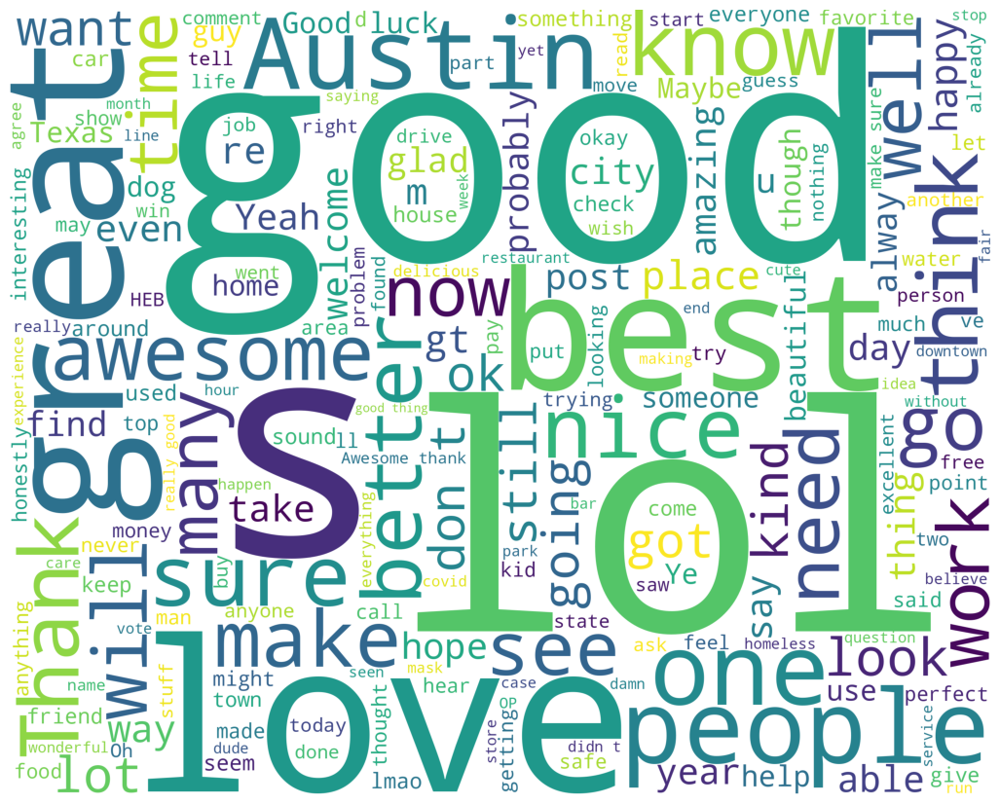

In [34]:
print("Positive words")
wordcloud_draw(train_pos,'white')

In [35]:
train_pos_1 = train_1[ train_1['polarity'] >= 0.5]
train_pos_1 = train_pos_1['body']
train_neg_1 = train_1[ train_1['polarity'] <= -0.5]
train_neg_1 = train_neg_1['body']

Positive words


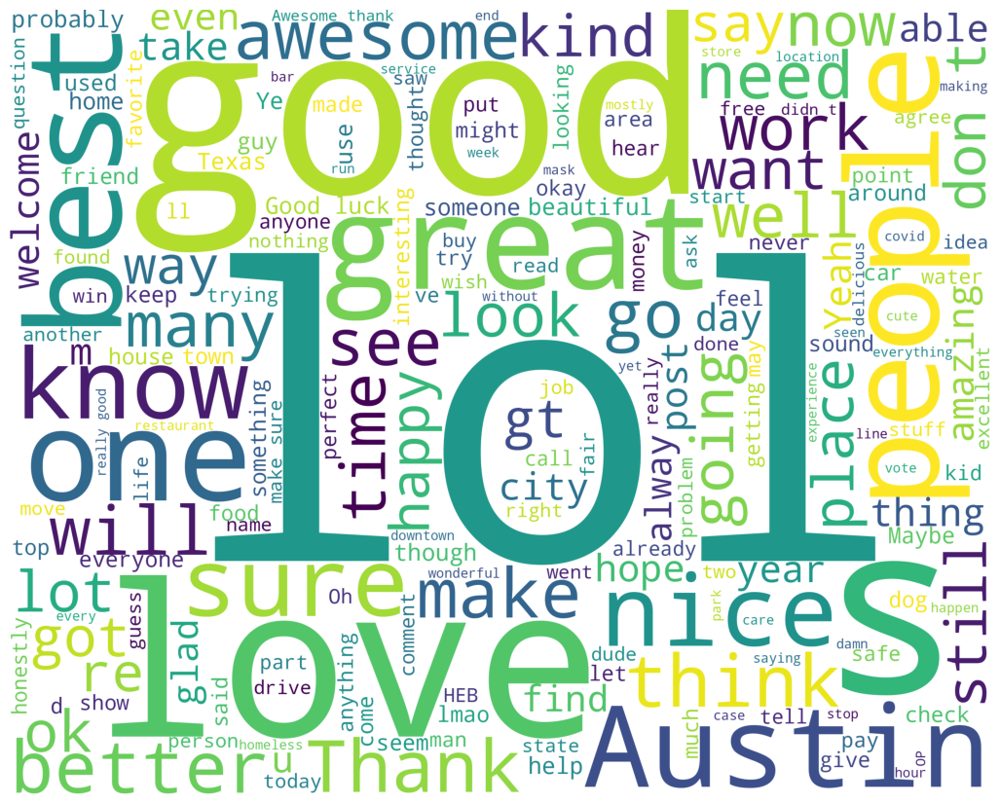

In [36]:
print("Positive words")
wordcloud_draw(train_pos_1,'white')

In [37]:
test_pos_1 = test_1[ test_1['polarity'] >= 0.5]
test_pos_1 = test_pos_1['body']
test_neg_1 = test_1[ test_1['polarity'] <= -0.5]
test_neg_1 = test_neg_1['body']

Positive words for test data



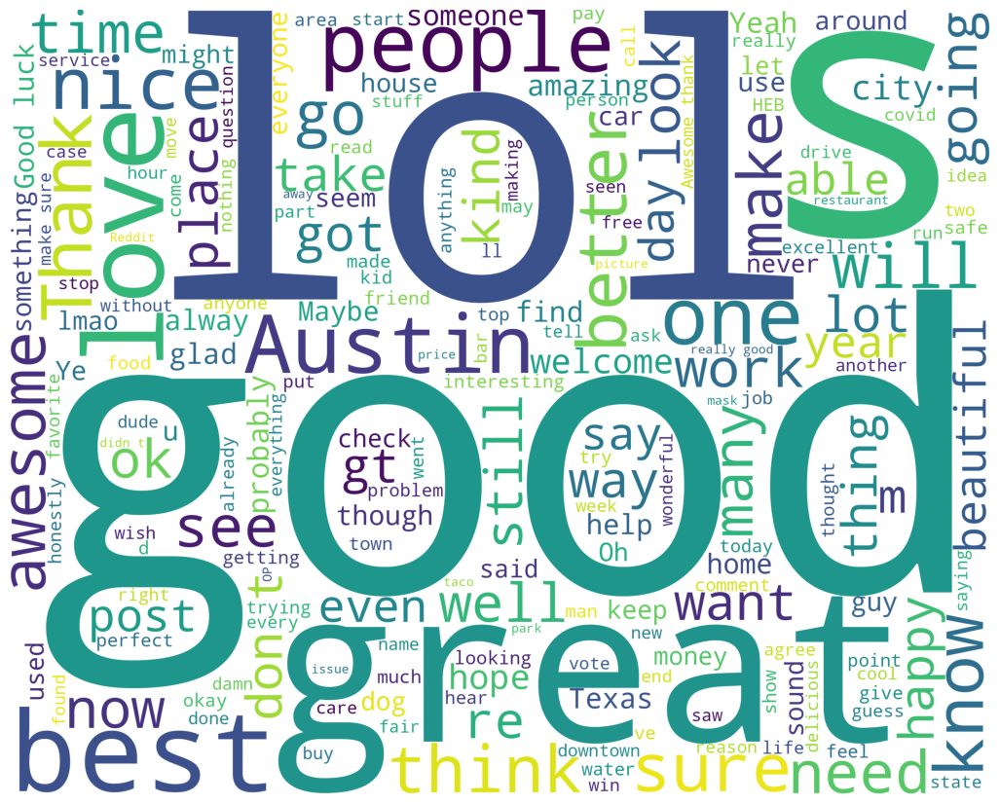

In [38]:
print("Positive words for test data")
print("")
wordcloud_draw(test_pos_1,'white')

#### Negative words

Negative words


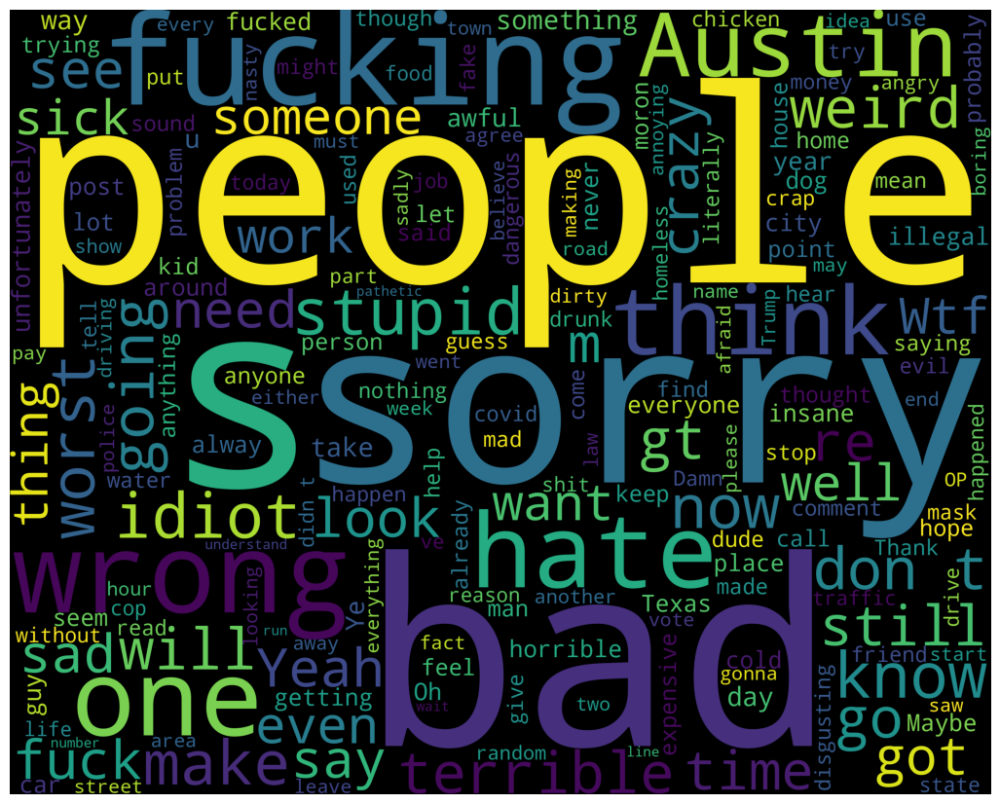

In [39]:
print("Negative words")
wordcloud_draw(train_neg)

Negative words


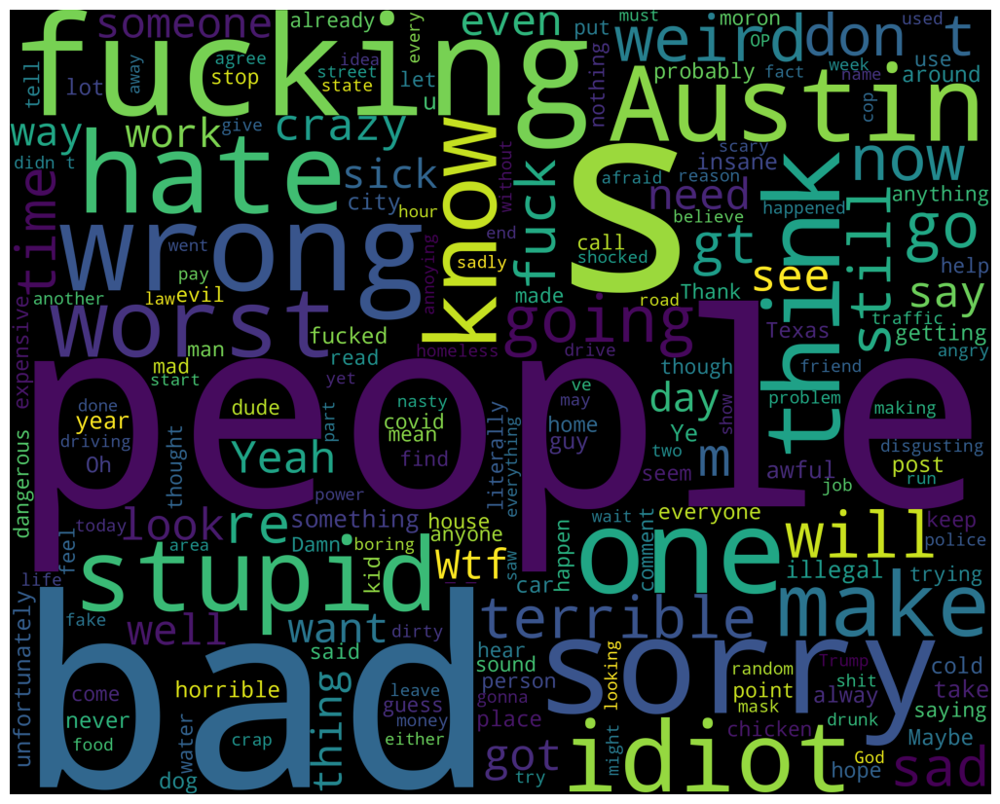

In [40]:
print("Negative words")
wordcloud_draw(train_neg_1)

After the vizualization, I removed the hashtags, mentions, links and stopwords from the training set.

**Stop Word:** Stop Words are words which do not contain important significance to be used in Search Queries. Usually these words are filtered out from search queries because they return vast amount of unnecessary information. ( the, for, this etc. )

In [41]:
tweets = []
import nltk
nltk.download('stopwords')
stopwords_set = set(stopwords.words("english"))

for index, row in df.iterrows():
    words_filtered = [e.lower() for e in row.body.split() if len(e) >= 3]
    words_cleaned = [word for word in words_filtered
        if 'http' not in word
        and not word.startswith('@')
        and not word.startswith('#')
        and word != 'RT']
    words_without_stopwords = [word for word in words_cleaned if not word in stopwords_set]
    tweets.append((words_without_stopwords, row.polarity))

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


As a next step we extracted the so called features with nltk lib, first by measuring a frequent distribution and by selecting the resulting keys.

In [42]:
# Extracting word features
def get_words_in_tweets(tweets):
    all = []
    for (words, sentiment) in tweets:
        all.extend(words)
    return all

def get_word_features(wordlist):
    wordlist = nltk.FreqDist(wordlist)
    features = wordlist.keys()
    return features
w_features = get_word_features(get_words_in_tweets(tweets))

def extract_features(document):
    document_words = set(document)
    features = {}
    for word in w_features:
        features['contains(%s)' % word] = (word in document_words)
    return features

Hereby I plotted the most frequently distributed words. The most words are centered around debate nights.


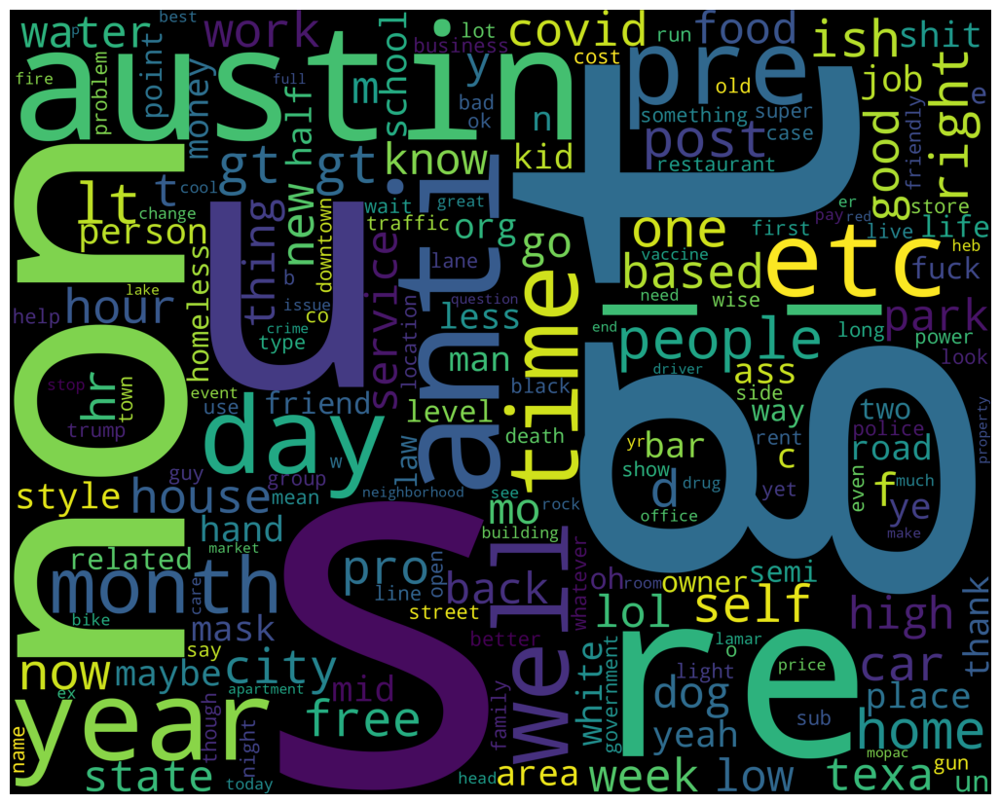

In [43]:
wordcloud_draw(w_features)

#### Most frequent positive words

In [44]:
train_pos_1 = df[ df['polarity'] >= 0.5]

In [45]:
pos_tweets = []
import nltk
nltk.download('stopwords')
stopwords_set = set(stopwords.words("english"))

for index, row in train_pos_1.iterrows():
    words_filtered = [e.lower() for e in row.body.split() if len(e) >= 3]
    words_cleaned = [word for word in words_filtered
        if 'http' not in word
        and not word.startswith('@')
        and not word.startswith('#')
        and word != 'RT']
    words_without_stopwords = [word for word in words_cleaned if not word in stopwords_set]
    pos_tweets.append((words_without_stopwords, row.polarity))
    
    
    

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [46]:
# Extracting word features
def get_words_in_tweets(pos_tweets):
    all = []
    for (words, sentiment) in pos_tweets:
        all.extend(words)
    return all

def get_word_features(wordlist):
    wordlist = nltk.FreqDist(wordlist)
    features = wordlist.keys()
    return features
w_features_pos = get_word_features(get_words_in_tweets(pos_tweets))

def extract_features(document):
    document_words = set(document)
    features = {}
    for word in w_features_pos:
        features['contains(%s)' % word] = (word in document_words)
    return features

Positive words


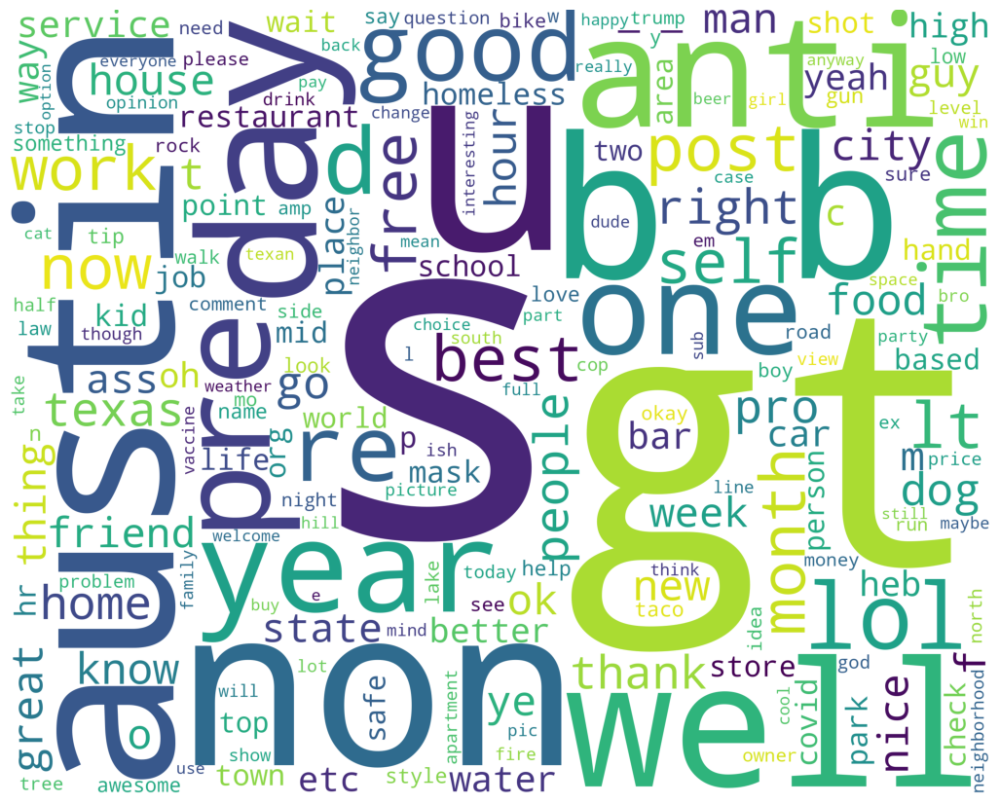

In [47]:
print("Positive words")
wordcloud_draw(w_features_pos,'white')

#### Most frequent positive words

In [48]:
train_neg_1 = df[ df['polarity'] <= -0.5]

neg_tweets = []
import nltk
nltk.download('stopwords')
stopwords_set = set(stopwords.words("english"))

for index, row in train_neg_1.iterrows():
    words_filtered_n = [e.lower() for e in row.body.split() if len(e) >= 3]
    words_cleaned_n = [word for word in words_filtered_n
        if 'http' not in word
        and not word.startswith('@')
        and not word.startswith('#')
        and word != 'RT']
    words_without_stopwords_n = [word for word in words_cleaned_n if not word in stopwords_set]
    neg_tweets.append((words_without_stopwords_n, row.polarity))

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [49]:
# Extracting word features
def get_words_in_tweets(neg_tweets):
    all = []
    for (words, sentiment) in neg_tweets:
        all.extend(words)
    return all

def get_word_features(wordlist):
    wordlist = nltk.FreqDist(wordlist)
    features = wordlist.keys()
    return features
w_features_neg = get_word_features(get_words_in_tweets(neg_tweets))

def extract_features(document):
    document_words = set(document)
    features = {}
    for word in w_features_neg:
        features['contains(%s)' % word] = (word in document_words)
    return features

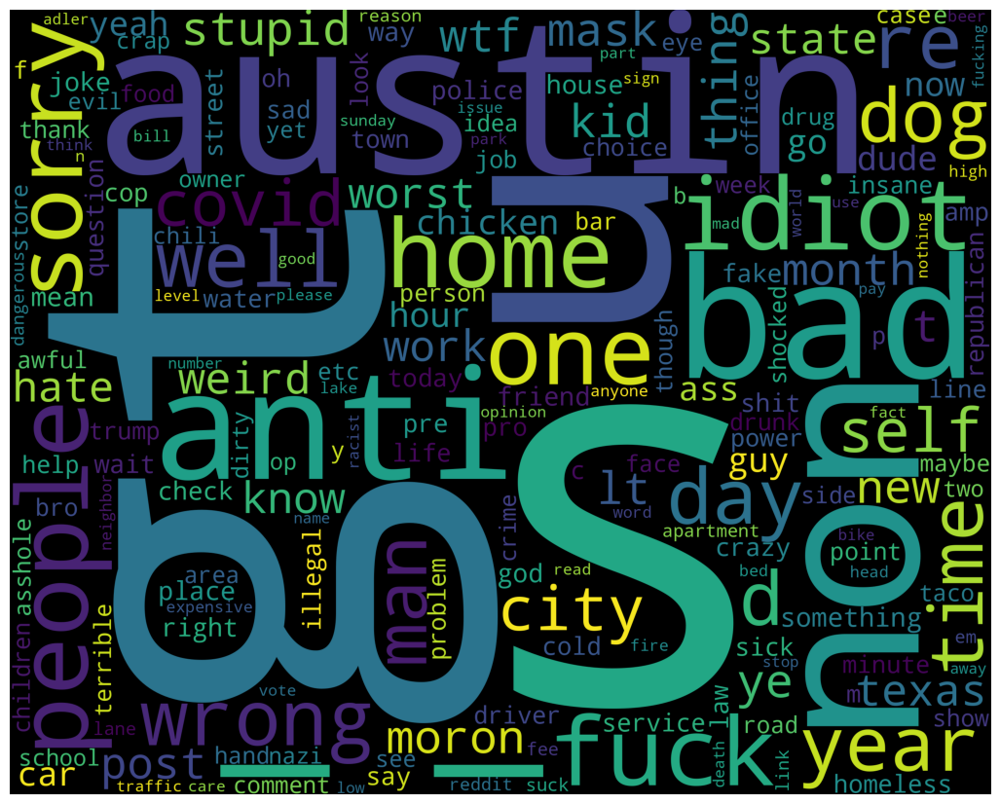

In [50]:
wordcloud_draw(w_features_neg)

### Sentiments over time

#### For the entire data set

In [51]:
df_cp = df.copy()
df_cp['Date'] = pd.to_datetime(df_cp['Date'])
df_cp['YearMonth'] = df_cp['Date'].dt.strftime('%Y-%m')

df_cp.head()

,body,Date,id,parent_id,score,polarity,subjectivity,fake_likelihood,YearMonth
0,Good god and apparently you work in software. ...,2020-05-23,frkm2w3,t1_frk44so,1.0,0.375000,0.475000,0.650000,2020-05
1,"Used to live near a Tune Up, was pretty happy ...",2020-05-23,frkm25i,t3_gp9g1d,1.0,0.257273,0.780000,0.462727,2020-05
2,I hope this whole fiasco makes the general pub...,2020-05-23,frkm22r,t3_gp9r8h,1.0,0.107500,0.429167,0.963333,2020-05
3,Thank you for asking the real question here.,2020-05-23,frkm1zl,t1_frj5uuk,1.0,0.200000,0.300000,1.000000,2020-05
4,Restaurants can sell alcohol to go (liquor) wh...,2020-05-23,frklyq2,t3_gowk9h,1.0,0.000000,1.000000,0.500000,2020-05


<Axes: title={'center': 'Sentiment Score'}, xlabel='Period', ylabel='Mean Sentiment Score'>

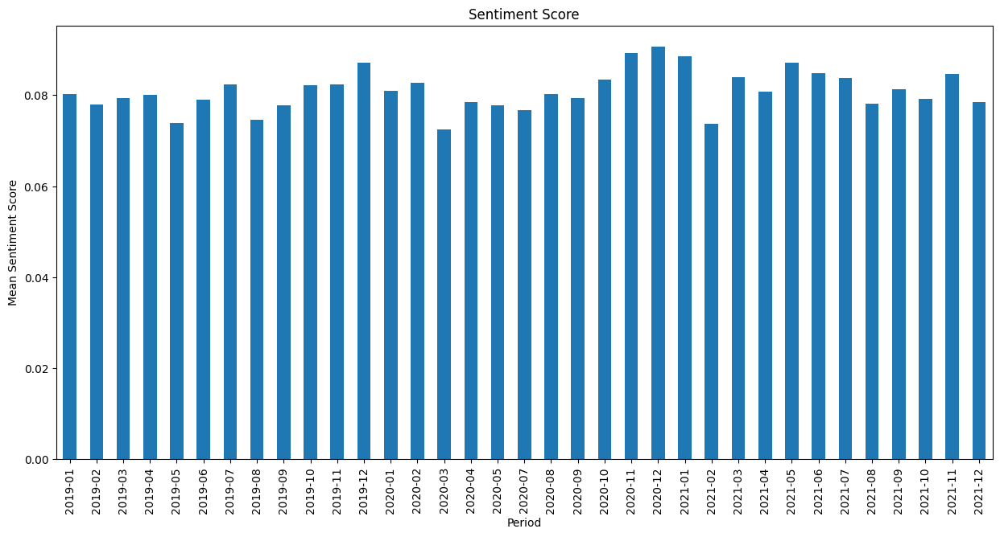

In [52]:
# generate mean of sentiment_score by period

dfg = df_cp.groupby(['YearMonth'])['polarity'].mean()

#create a bar plot
dfg.plot(kind='bar', title='Sentiment Score', ylabel='Mean Sentiment Score',
         xlabel='Period', figsize=(15, 7))

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34]),
 [Text(0, 0, '2020-05'),
  Text(1, 0, '2020-04'),
  Text(2, 0, '2020-03'),
  Text(3, 0, '2020-02'),
  Text(4, 0, '2020-01'),
  Text(5, 0, '2019-12'),
  Text(6, 0, '2019-11'),
  Text(7, 0, '2019-10'),
  Text(8, 0, '2019-09'),
  Text(9, 0, '2019-08'),
  Text(10, 0, '2019-07'),
  Text(11, 0, '2019-06'),
  Text(12, 0, '2019-05'),
  Text(13, 0, '2019-04'),
  Text(14, 0, '2019-03'),
  Text(15, 0, '2019-02'),
  Text(16, 0, '2019-01'),
  Text(17, 0, '2021-12'),
  Text(18, 0, '2021-11'),
  Text(19, 0, '2021-10'),
  Text(20, 0, '2021-09'),
  Text(21, 0, '2021-08'),
  Text(22, 0, '2021-07'),
  Text(23, 0, '2021-06'),
  Text(24, 0, '2021-05'),
  Text(25, 0, '2021-04'),
  Text(26, 0, '2021-03'),
  Text(27, 0, '2021-02'),
  Text(28, 0, '2021-01'),
  Text(29, 0, '2020-12'),
  Text(30, 0, '2020-11'),
  Text(31, 0, '2020-10'),
  Text(32, 0

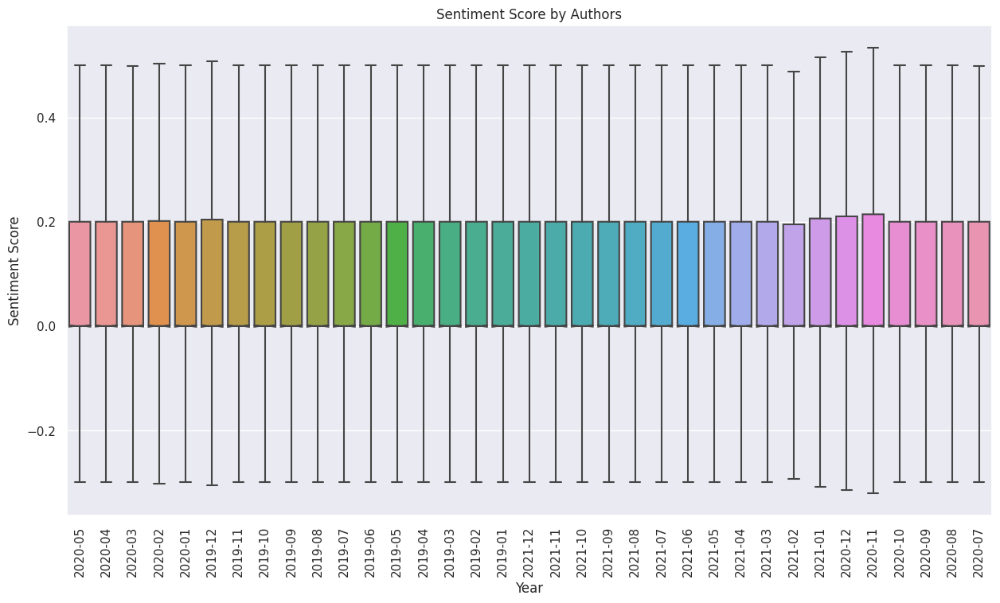

In [53]:
import seaborn as sns
#create seaborn boxplots by group
sns.set(rc={"figure.figsize":(15, 8)})
sns.boxplot(x='YearMonth', y='polarity', notch = True,
            data=df_cp, showfliers=False).set(title='Sentiment Score by Authors')
#modify axis labels
plt.xlabel('Year')
plt.ylabel('Sentiment Score')
plt.xticks(rotation=90)

#### For the stages data set

In [54]:
stages_cp = stages.copy()
stages_cp['Date'] = pd.to_datetime(stages_cp['Date'])
stages_cp['YearMonth'] = stages_cp['Date'].dt.strftime('%Y-%m')

In [55]:
stages_cp.head()

,author,body,Date,id,parent_id,score,Group,Stage,stage_num,polarity,subjectivity,fake_likelihood,YearMonth
0,helljess,Woman*. Iâ€™m sorry grown-up words and drugs o...,2020-03-24,fleu096,t1_fleroki,1,6,stage 0,0,-0.0025,0.585,0.9175,2020-03
1,TxEx,Fake news believers/Dan Patrick supporters.,2020-03-24,fletz0o,t3_foexxq,1,6,stage 0,0,-0.5000,1.000,1.0000,2020-03
2,Roflattack,They won't pull you over for driving. Don't g...,2020-03-24,flep3ja,t1_flel6mj,1,6,stage 0,0,0.0000,0.000,1.5000,2020-03
3,insureventures,In Austin critical includes Pet shops.,2020-03-24,fleskl5,t3_fo6ynn,1,6,stage 0,0,0.0000,0.800,0.7000,2020-03
4,dyankee13,Edibles! ðŸ”¥ðŸ”¥ðŸ”¥,2020-03-24,fleskkw,t1_flco8rq,1,6,stage 0,0,0.0000,0.000,1.5000,2020-03


<Axes: title={'center': 'Sentiment Score for staged data'}, xlabel='Period', ylabel='Mean Sentiment Score'>

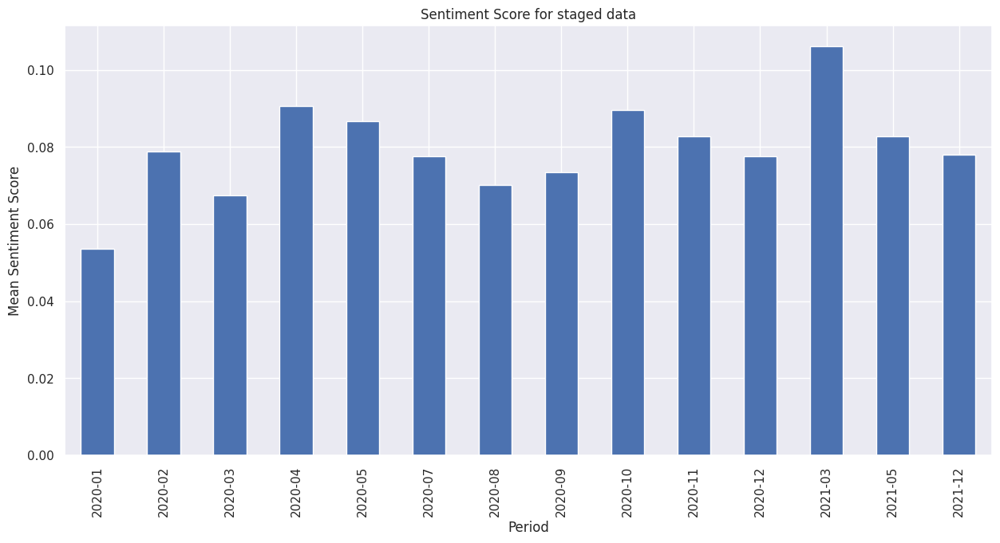

In [56]:
#generate mean of sentiment_score by period
dfg = stages_cp.groupby(['YearMonth'])['polarity'].mean()

#create a bar plot
dfg.plot(kind='bar', title='Sentiment Score for staged data', ylabel='Mean Sentiment Score',
         xlabel='Period', figsize=(15, 7))

<Axes: title={'center': 'Sentiment Score for stages data'}, xlabel='Stages', ylabel='Mean Sentiment Score'>

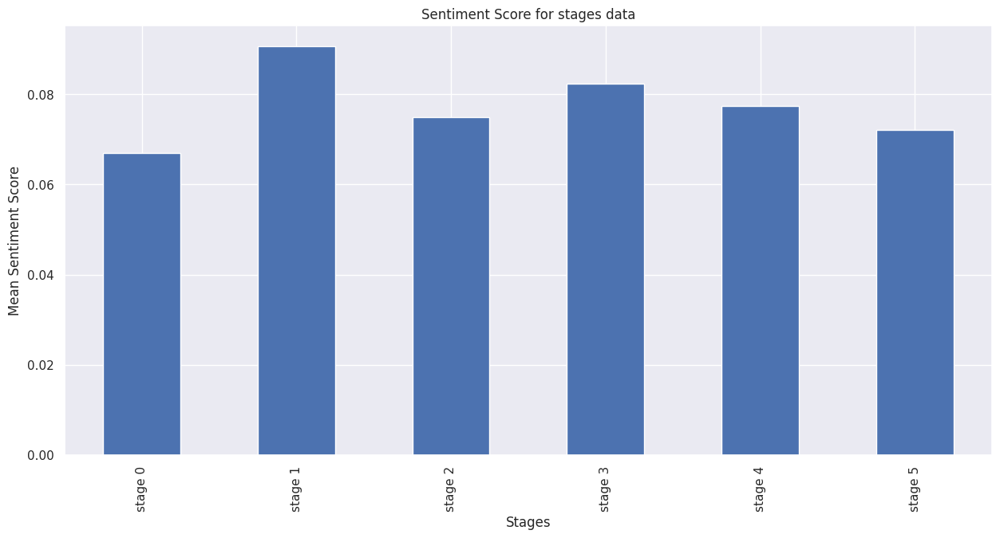

In [57]:
#generate mean of sentiment_score by period
dfg1 = stages_cp.groupby(['Stage'])['polarity'].mean()

#create a bar plot
dfg1.plot(kind='bar', title='Sentiment Score for stages data', ylabel='Mean Sentiment Score',
         xlabel='Stages', figsize=(15, 7))

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'stage 0'),
  Text(1, 0, 'stage 1'),
  Text(2, 0, 'stage 2'),
  Text(3, 0, 'stage 3'),
  Text(4, 0, 'stage 4'),
  Text(5, 0, 'stage 5')])

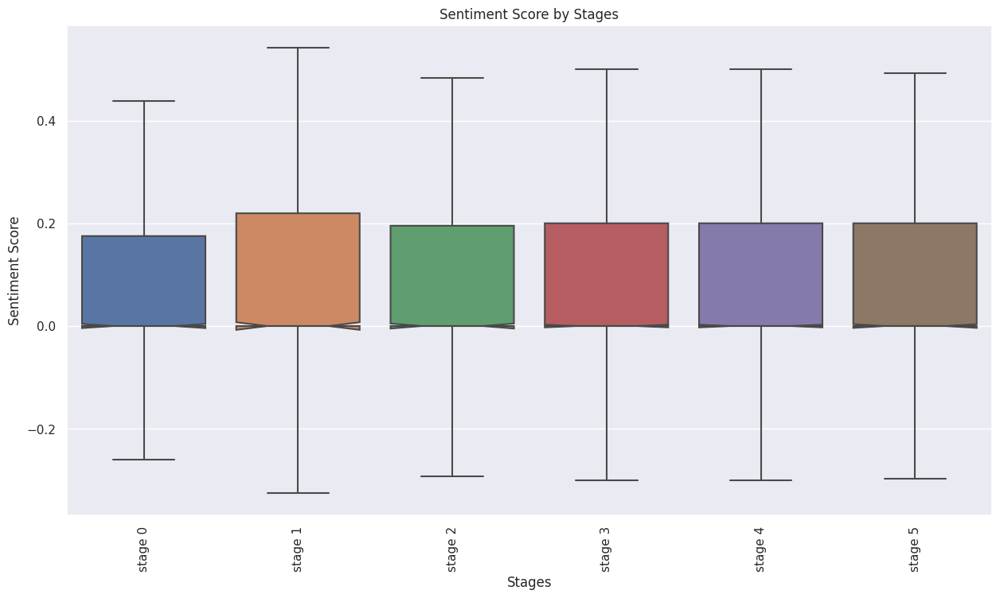

In [58]:
import seaborn as sns
#create seaborn boxplots by group
sns.set(rc={"figure.figsize":(15, 8)})
sns.boxplot(x='Stage', y='polarity', notch = True,
            data=stages_cp, showfliers=False).set(title='Sentiment Score by Stages')
#modify axis labels
plt.xlabel('Stages')
plt.ylabel('Sentiment Score')
plt.xticks(rotation=90)

## How subjective were people over time

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34]),
 [Text(0, 0, '2020-05'),
  Text(1, 0, '2020-04'),
  Text(2, 0, '2020-03'),
  Text(3, 0, '2020-02'),
  Text(4, 0, '2020-01'),
  Text(5, 0, '2019-12'),
  Text(6, 0, '2019-11'),
  Text(7, 0, '2019-10'),
  Text(8, 0, '2019-09'),
  Text(9, 0, '2019-08'),
  Text(10, 0, '2019-07'),
  Text(11, 0, '2019-06'),
  Text(12, 0, '2019-05'),
  Text(13, 0, '2019-04'),
  Text(14, 0, '2019-03'),
  Text(15, 0, '2019-02'),
  Text(16, 0, '2019-01'),
  Text(17, 0, '2021-12'),
  Text(18, 0, '2021-11'),
  Text(19, 0, '2021-10'),
  Text(20, 0, '2021-09'),
  Text(21, 0, '2021-08'),
  Text(22, 0, '2021-07'),
  Text(23, 0, '2021-06'),
  Text(24, 0, '2021-05'),
  Text(25, 0, '2021-04'),
  Text(26, 0, '2021-03'),
  Text(27, 0, '2021-02'),
  Text(28, 0, '2021-01'),
  Text(29, 0, '2020-12'),
  Text(30, 0, '2020-11'),
  Text(31, 0, '2020-10'),
  Text(32, 0

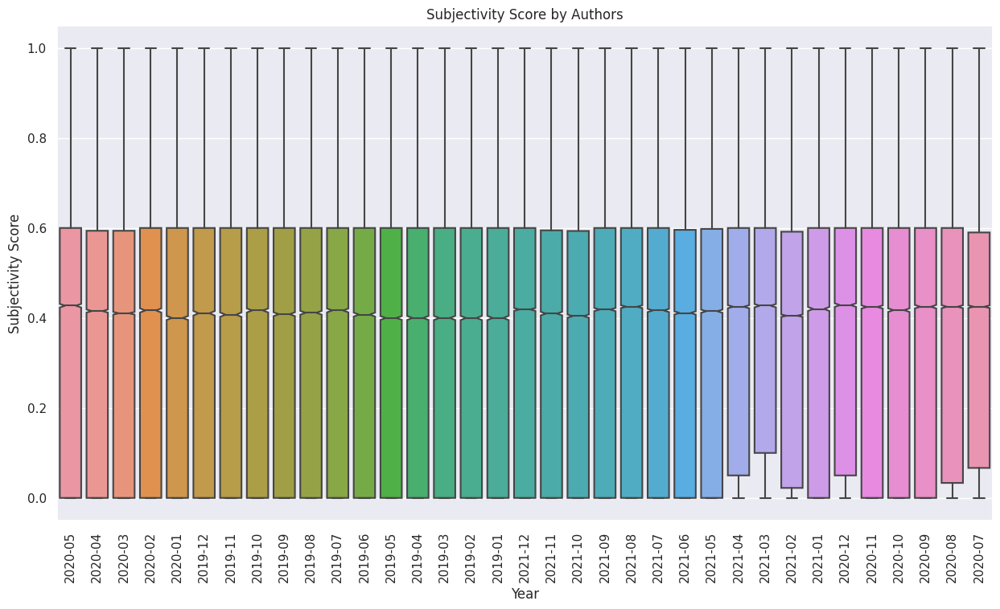

In [59]:
import seaborn as sns
#create seaborn boxplots by group
sns.set(rc={"figure.figsize":(15, 8)})
sns.boxplot(x='YearMonth', y='subjectivity', notch = True,
            data=df_cp, showfliers=False).set(title='Subjectivity Score by Authors')
#modify axis labels
plt.xlabel('Year')
plt.ylabel('Subjectivity Score')
plt.xticks(rotation=90)

<Axes: title={'center': 'Subjectivity'}, xlabel='Period', ylabel='Mean Sentiment Score'>

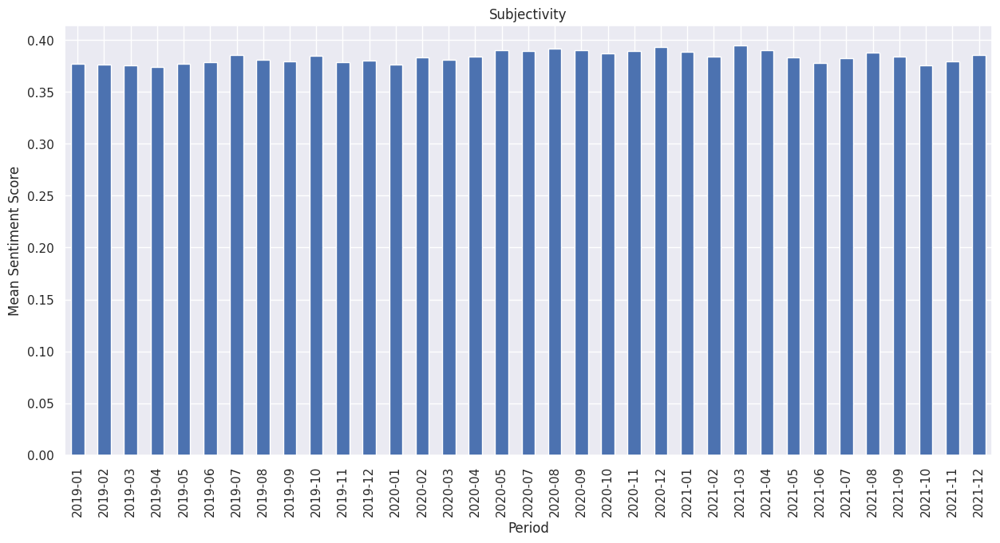

In [60]:
# generate mean of sentiment_score by period

dfg_sub = df_cp.groupby(['YearMonth'])['subjectivity'].mean()

#create a bar plot
dfg_sub.plot(kind='bar', title='Subjectivity', ylabel='Mean Sentiment Score',
         xlabel='Period', figsize=(15, 7))

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, '2020-03'),
  Text(1, 0, '2020-04'),
  Text(2, 0, '2021-05'),
  Text(3, 0, '2020-05'),
  Text(4, 0, '2020-07'),
  Text(5, 0, '2020-08'),
  Text(6, 0, '2020-10'),
  Text(7, 0, '2021-03'),
  Text(8, 0, '2020-02'),
  Text(9, 0, '2020-09'),
  Text(10, 0, '2020-11'),
  Text(11, 0, '2021-12'),
  Text(12, 0, '2020-01'),
  Text(13, 0, '2020-12')])

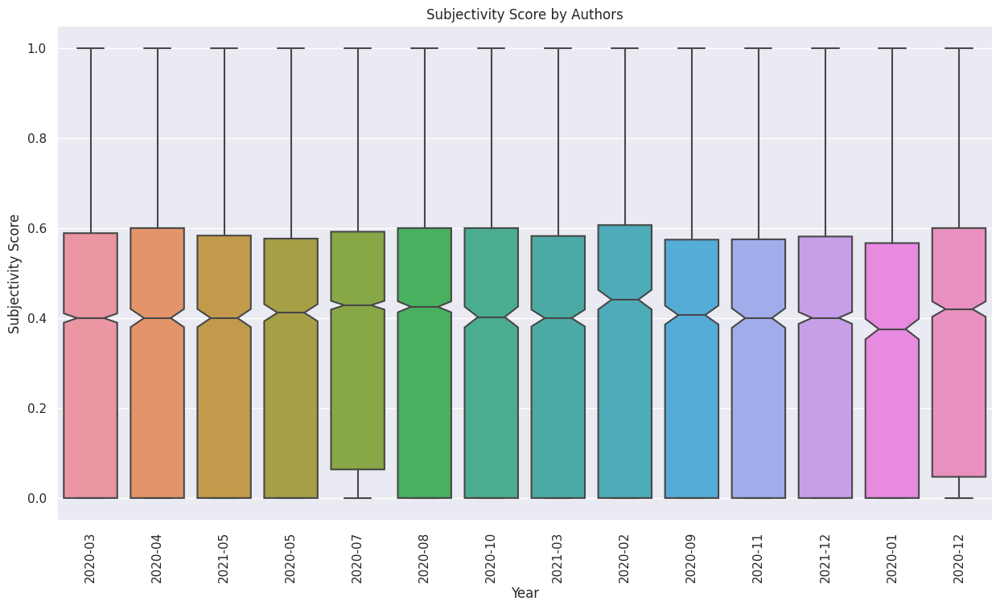

In [61]:
import seaborn as sns
#create seaborn boxplots by s6tage
sns.set(rc={"figure.figsize":(15, 8)})
sns.boxplot(x='YearMonth', y='subjectivity', notch = True,
            data=stages_cp, showfliers=False).set(title='Subjectivity Score by Authors')
#modify axis labels
plt.xlabel('Year')
plt.ylabel('Subjectivity Score')
plt.xticks(rotation=90)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'stage 0'),
  Text(1, 0, 'stage 1'),
  Text(2, 0, 'stage 2'),
  Text(3, 0, 'stage 3'),
  Text(4, 0, 'stage 4'),
  Text(5, 0, 'stage 5')])

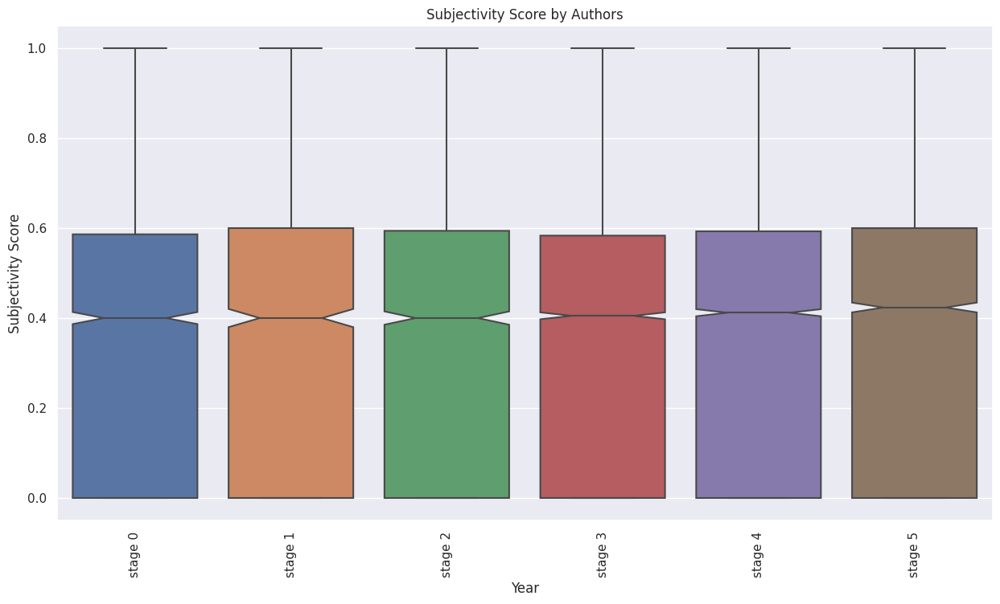

In [62]:
import seaborn as sns
#create seaborn boxplots by s6tage
sns.set(rc={"figure.figsize":(15, 8)})
sns.boxplot(x='Stage', y='subjectivity', notch = True,
            data=stages_cp, showfliers=False).set(title='Subjectivity Score by Authors')
#modify axis labels
plt.xlabel('Year')
plt.ylabel('Subjectivity Score')
plt.xticks(rotation=90)

<Axes: title={'center': 'Subjectivity'}, xlabel='Period', ylabel='Mean Sentiment Score'>

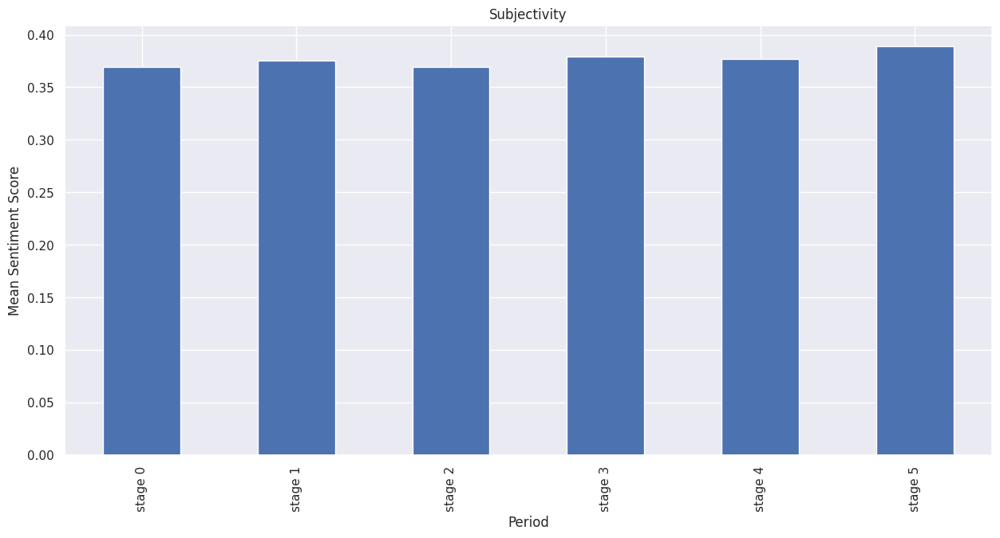

In [63]:
# generate mean of subjective_score by stage

dfg_sub = stages_cp.groupby(['Stage'])['subjectivity'].mean()

#create a bar plot
dfg_sub.plot(kind='bar', title='Subjectivity', ylabel='Mean Sentiment Score',
         xlabel='Period', figsize=(15, 7))

## Time series plot

#### For general data

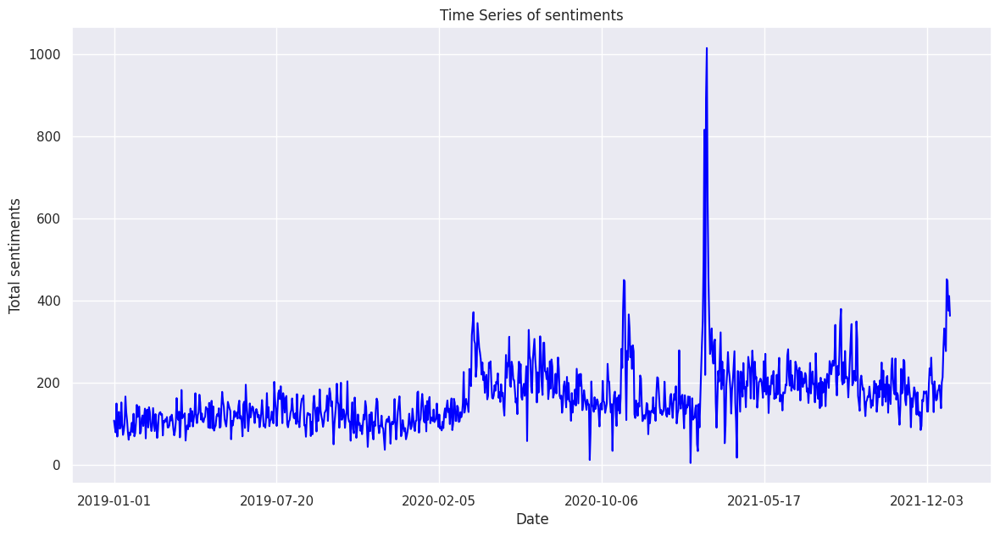

In [64]:
# Aggregate scores by date
time_series = df.groupby('Date')['polarity'].sum()

# Plot the time series of scores
plt.figure(figsize=(14, 7))
time_series.plot(title='Time Series of sentiments', color='blue')
plt.xlabel('Date')
plt.ylabel('Total sentiments')
plt.grid(True)
plt.show()

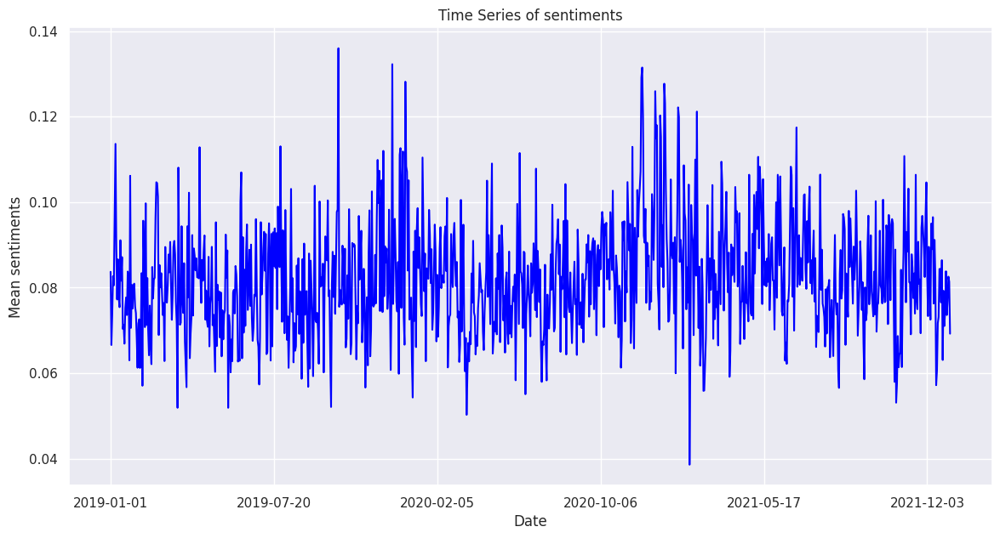

In [65]:
# Aggregate scores by date
time_series = df.groupby('Date')['polarity'].mean()

# Plot the time series of scores
plt.figure(figsize=(14, 7))
time_series.plot(title='Time Series of sentiments', color='blue')
plt.xlabel('Date')
plt.ylabel('Mean sentiments')
plt.grid(True)
plt.show()

#### For stages

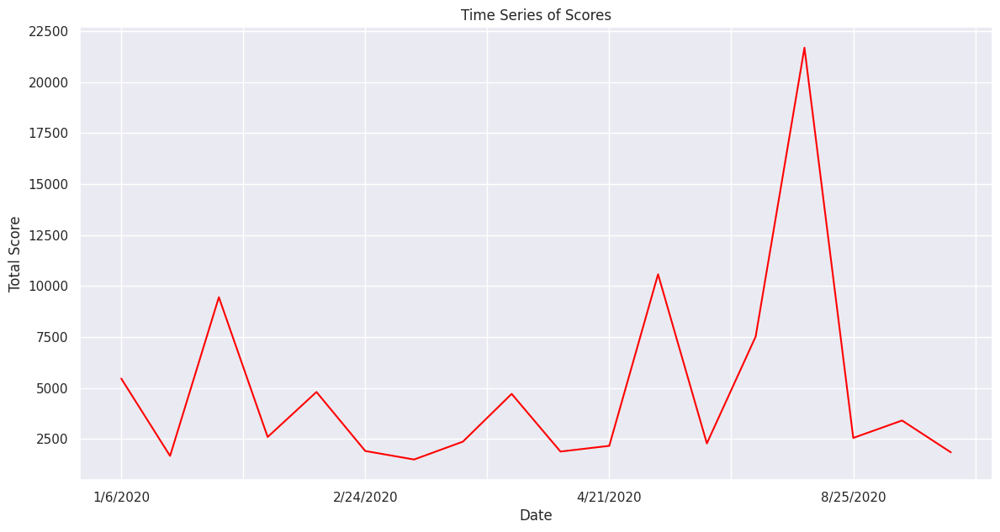

In [66]:
# Aggregate scores by date
time_series = stages.groupby('Date')['score'].sum()

# Plot the time series of scores
plt.figure(figsize=(14, 7))
time_series.plot(title='Time Series of Scores', color='red')
plt.xlabel('Date')
plt.ylabel('Total Score')
plt.grid(True)
plt.show()

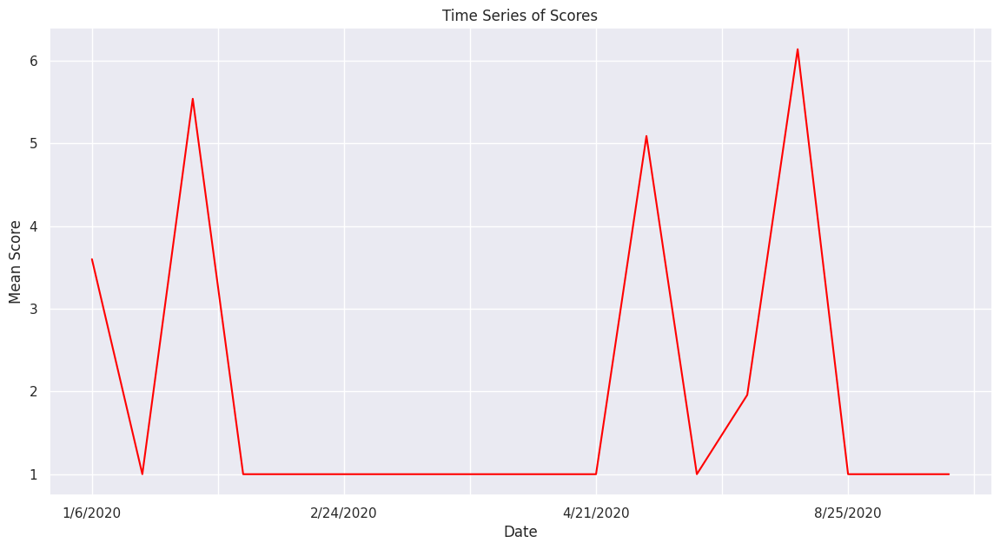

In [67]:
# Aggregate scores by date
time_series = stages.groupby('Date')['score'].mean()

# Plot the time series of scores
plt.figure(figsize=(14, 7))
time_series.plot(title='Time Series of Scores', color='red')
plt.xlabel('Date')
plt.ylabel('Mean Score')
plt.grid(True)
plt.show()

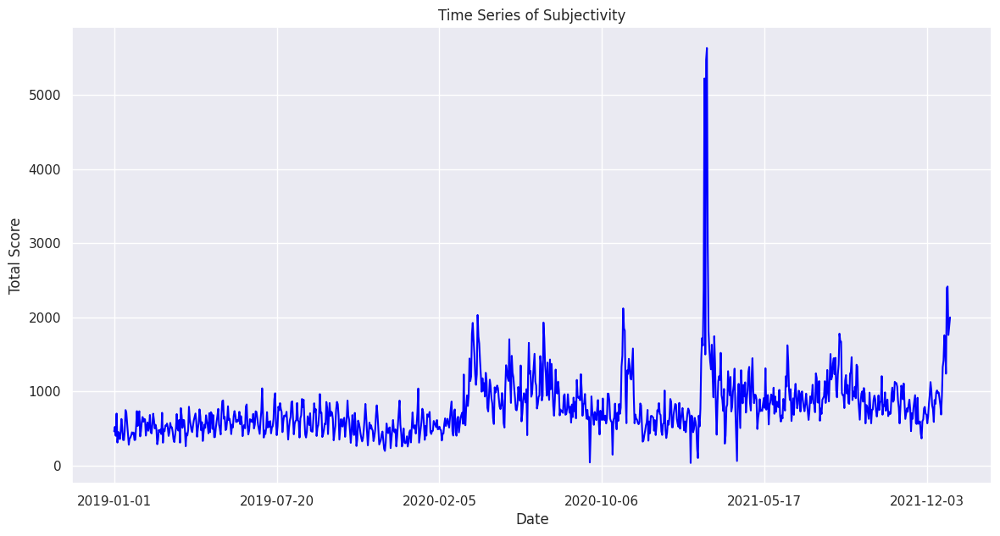

In [68]:
# Aggregate scores by date
time_series = df.groupby('Date')['subjectivity'].sum()

# Plot the time series of scores
plt.figure(figsize=(14, 7))
time_series.plot(title='Time Series of Subjectivity', color='blue')
plt.xlabel('Date')
plt.ylabel('Total Score')
plt.grid(True)
plt.show()

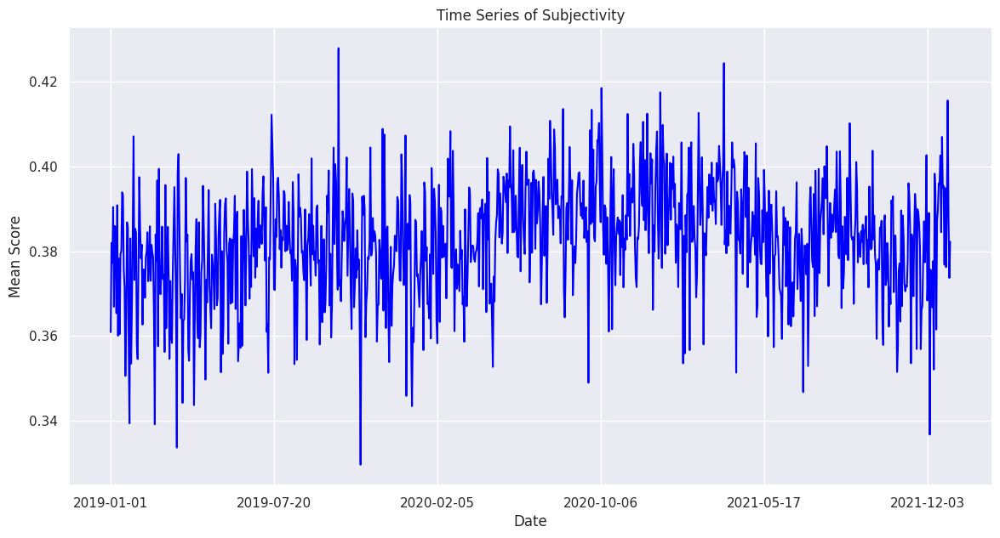

In [69]:
# Aggregate scores by date
time_series = df.groupby('Date')['subjectivity'].mean()

# Plot the time series of scores
plt.figure(figsize=(14, 7))
time_series.plot(title='Time Series of Subjectivity', color='blue')
plt.xlabel('Date')
plt.ylabel('Mean Score')
plt.grid(True)
plt.show()

#### For stages (subjectivity)

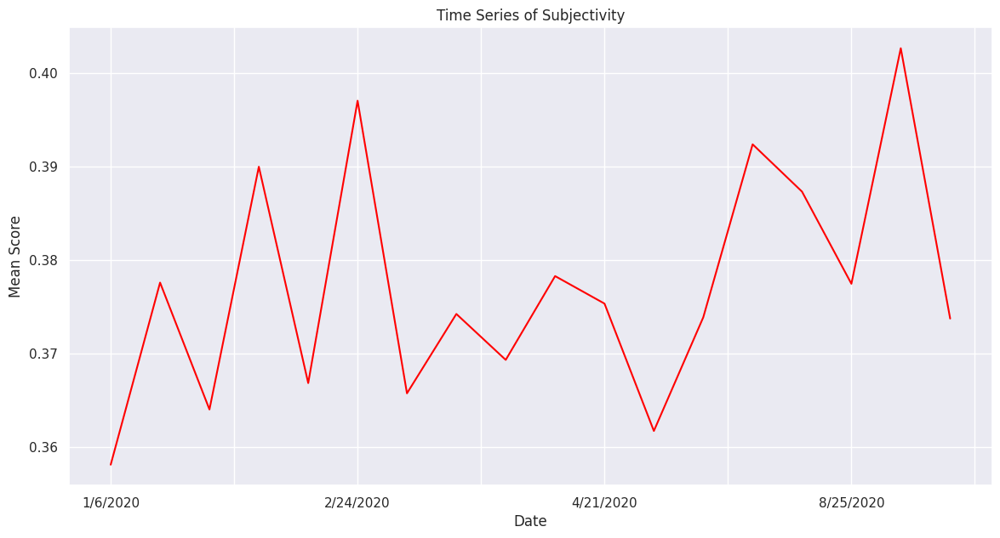

In [70]:
# Aggregate scores by date
time_series = stages.groupby('Date')['subjectivity'].mean()

# Plot the time series of scores
plt.figure(figsize=(14, 7))
time_series.plot(title='Time Series of Subjectivity', color='red')
plt.xlabel('Date')
plt.ylabel('Mean Score')
plt.grid(True)
plt.show()

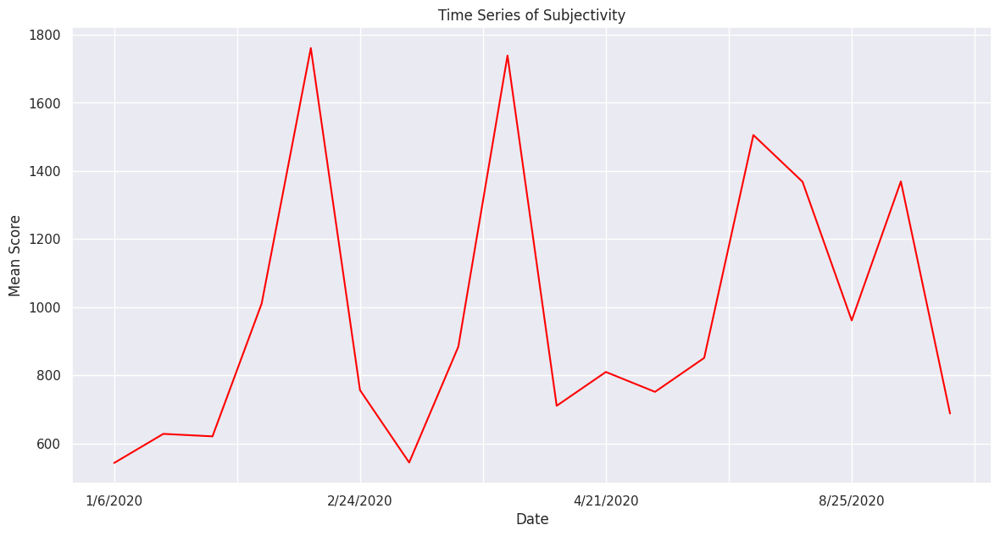

In [71]:
# Aggregate scores by date
time_series = stages.groupby('Date')['subjectivity'].sum()

# Plot the time series of scores
plt.figure(figsize=(14, 7))
time_series.plot(title='Time Series of Subjectivity', color='red')
plt.xlabel('Date')
plt.ylabel('Mean Score')
plt.grid(True)
plt.show()

### Distribution of user replies to Parent Comments

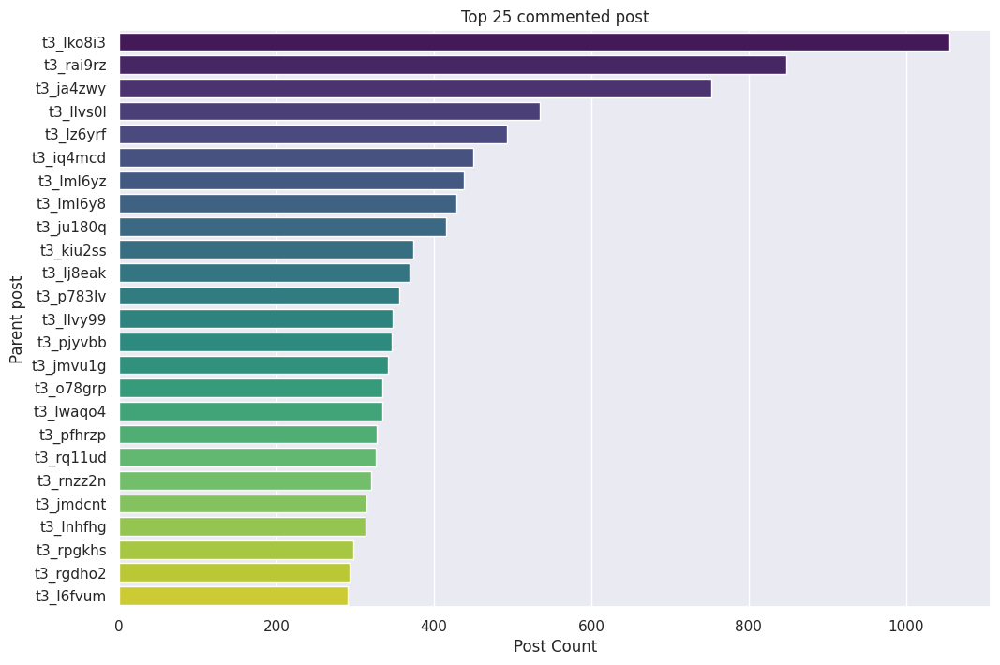

In [72]:
#  Distribution of user replies to Parent Comments
user_counts = df['parent_id'].value_counts().head(25)

plt.figure(figsize=(12, 8))
sns.barplot(x=user_counts.values, y=user_counts.index, palette='viridis')
plt.title('Top 25 commented post')
plt.xlabel('Post Count')
plt.ylabel('Parent post')
plt.show()

### Distribution of post length

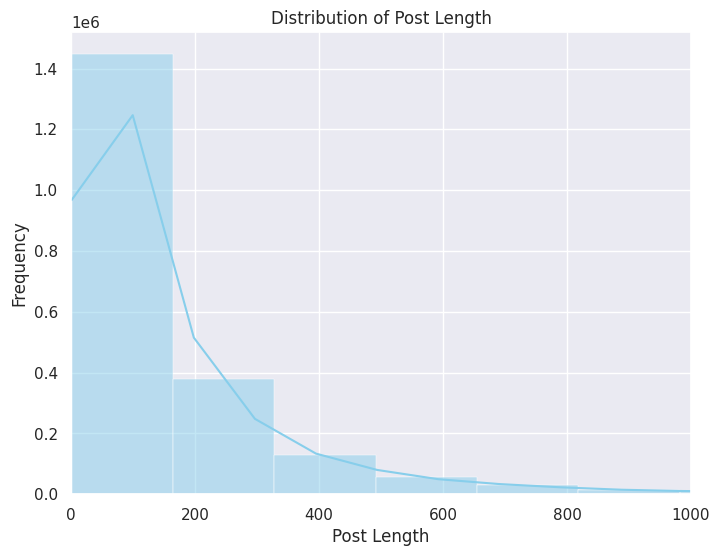

In [73]:
#  Post Length Distribution
df_s = df.copy()
df_s['post_length'] = df_s['body'].apply(len)

plt.figure(figsize=(8, 6))
sns.histplot(data=df_s, x='post_length', bins=120, kde=True, color='skyblue')
plt.title('Distribution of Post Length')
plt.xlabel('Post Length')
plt.ylabel('Frequency')
plt.xlim(0, 1000)
plt.show()

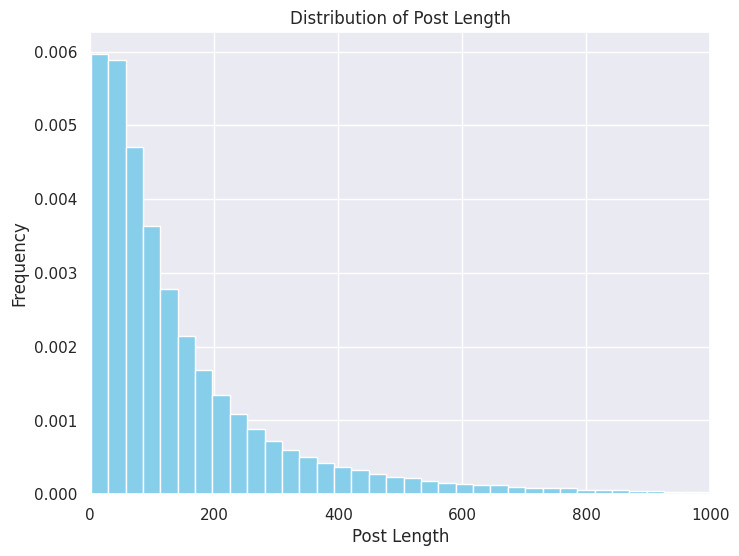

In [74]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Copy the DataFrame and calculate post lengths
df_s = df.copy()
df_s['post_length'] = df_s['body'].apply(len)
plt.figure(figsize=(8, 6))
plt.hist(df_s['post_length'], bins=700, color='skyblue', density=True)
plt.title('Distribution of Post Length')
plt.xlabel('Post Length')
plt.ylabel('Frequency')
plt.xlim(0, 1000)
plt.grid(True)
plt.show()


Creating another column to store mood of the post based on the polarity

In [75]:
# Create a new column called "sentiment_label"
dfa=df.copy()
dfa['sentiment_label'] = pd.cut(dfa['polarity'], [-1, -0.5, 0.5, 1], labels=['Negative', 'Neutral', 'Positive'])

# Print the DataFrame
dfa.head()

,body,Date,id,parent_id,score,polarity,subjectivity,fake_likelihood,sentiment_label
0,Good god and apparently you work in software. ...,2020-05-23,frkm2w3,t1_frk44so,1.0,0.375000,0.475000,0.650000,Neutral
1,"Used to live near a Tune Up, was pretty happy ...",2020-05-23,frkm25i,t3_gp9g1d,1.0,0.257273,0.780000,0.462727,Neutral
2,I hope this whole fiasco makes the general pub...,2020-05-23,frkm22r,t3_gp9r8h,1.0,0.107500,0.429167,0.963333,Neutral
3,Thank you for asking the real question here.,2020-05-23,frkm1zl,t1_frj5uuk,1.0,0.200000,0.300000,1.000000,Neutral
4,Restaurants can sell alcohol to go (liquor) wh...,2020-05-23,frklyq2,t3_gowk9h,1.0,0.000000,1.000000,0.500000,Neutral


In [76]:
# Create a new column called "sentiment_label"
stagea=stages.copy()
stagea['sentiment_label'] = pd.cut(stagea['polarity'], [-1, -0.5, 0.5, 1], labels=['Negative', 'Neutral', 'Positive'])

# Print the DataFrame
stagea.head()

,author,body,Date,id,parent_id,score,Group,Stage,stage_num,polarity,subjectivity,fake_likelihood,sentiment_label
0,helljess,Woman*. Iâ€™m sorry grown-up words and drugs o...,3/24/2020,fleu096,t1_fleroki,1,6,stage 0,0,-0.0025,0.585,0.9175,Neutral
1,TxEx,Fake news believers/Dan Patrick supporters.,3/24/2020,fletz0o,t3_foexxq,1,6,stage 0,0,-0.5000,1.000,1.0000,Negative
2,Roflattack,They won't pull you over for driving. Don't g...,3/24/2020,flep3ja,t1_flel6mj,1,6,stage 0,0,0.0000,0.000,1.5000,Neutral
3,insureventures,In Austin critical includes Pet shops.,3/24/2020,fleskl5,t3_fo6ynn,1,6,stage 0,0,0.0000,0.800,0.7000,Neutral
4,dyankee13,Edibles! ðŸ”¥ðŸ”¥ðŸ”¥,3/24/2020,fleskkw,t1_flco8rq,1,6,stage 0,0,0.0000,0.000,1.5000,Neutral


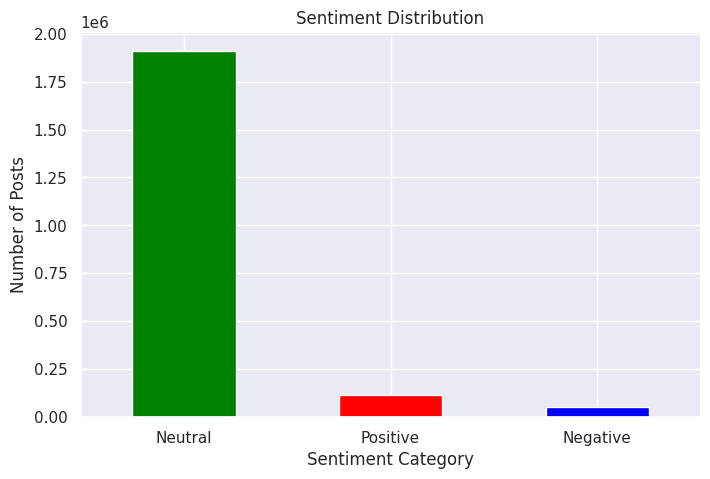

In [77]:
# Count the number of posts in each sentiment category
sentiment_counts = dfa['sentiment_label'].value_counts()

# Create a bar chart to visualize sentiment distribution
plt.figure(figsize=(8, 5))
sentiment_counts.plot(kind='bar', color=['green', 'red', 'blue'])
plt.title("Sentiment Distribution")
plt.xlabel("Sentiment Category")
plt.ylabel("Number of Posts")
plt.xticks(rotation=0)
plt.show()


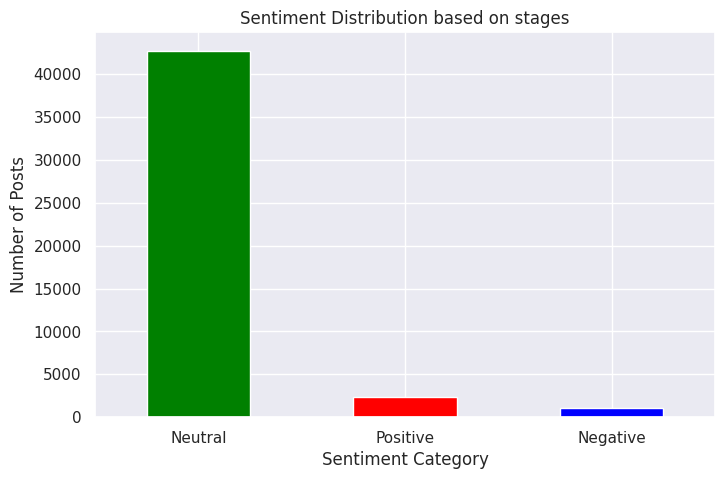

In [78]:
# Count the number of posts in each sentiment category
sentiment_counts = stagea['sentiment_label'].value_counts()

# Create a bar chart to visualize sentiment distribution
plt.figure(figsize=(8, 5))
sentiment_counts.plot(kind='bar', color=['green', 'red', 'blue'])
plt.title("Sentiment Distribution based on stages")
plt.xlabel("Sentiment Category")
plt.ylabel("Number of Posts")
plt.xticks(rotation=0)
plt.show()

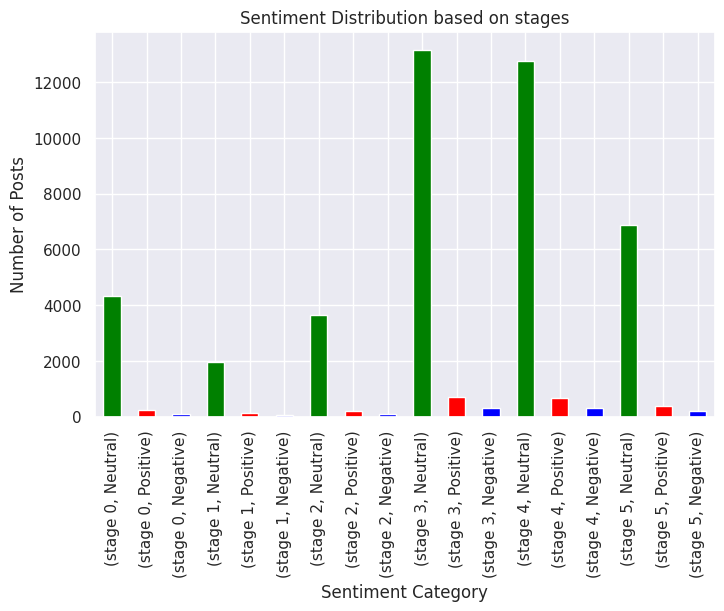

In [79]:
# Count the number of posts in each sentiment category
time_series = stagea.groupby('Stage')['sentiment_label'].value_counts()
#sentiment_counts = stagea['sentiment_label'].value_counts()

# Create a bar chart to visualize sentiment distribution
plt.figure(figsize=(8, 5))
time_series.plot(kind='bar', color=['green', 'red', 'blue'])
plt.title("Sentiment Distribution based on stages")
plt.xlabel("Sentiment Category")
plt.ylabel("Number of Posts")
plt.xticks(rotation=90)
plt.show()

In [80]:
time_series = stagea.groupby('Stage')['sentiment_label'].value_counts()
time_series

Stage    sentiment_label
stage 0  Neutral             4346
         Positive             243
         Negative             108
stage 1  Neutral             1975
         Positive             122
         Negative              54
stage 2  Neutral             3647
         Positive             201
         Negative              97
stage 3  Neutral            13152
         Positive             697
         Negative             296
stage 4  Neutral            12751
         Positive             679
         Negative             331
stage 5  Neutral             6877
         Positive             401
         Negative             208
Name: sentiment_label, dtype: int64

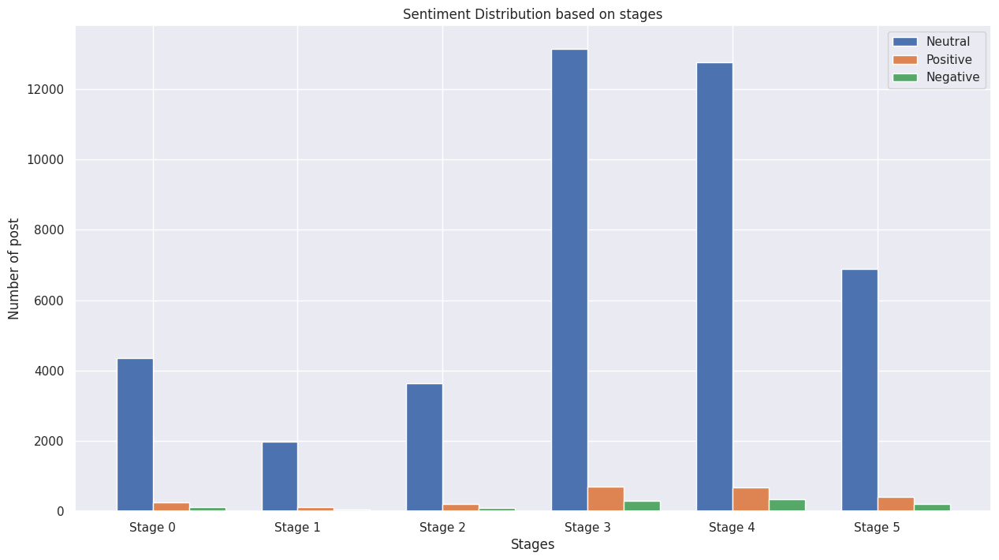

In [81]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
Stages = ['Stage 0', 'Stage 1', 'Stage 2', 'Stage 3', 'Stage 4', 'Stage 5']
group_names = ['Neutral', 'Positive', 'Negative']
values = np.array([[4346, 1975, 3647, 13152, 12751, 6877], [243, 122, 201, 697, 679, 401], [108, 54, 97, 296, 331, 208]])

# Set the width of the bars
bar_width = 0.25

# Create the figure and axes
fig, ax = plt.subplots()

# Create the bars for each group
for i, group_name in enumerate(group_names):
    bar_positions = np.arange(len(Stages)) + i * bar_width
    bars = ax.bar(bar_positions, values[i], bar_width, label=group_name)

# Set the x-axis labels and title
ax.set_xticks(np.arange(len(Stages)) + bar_width / 2)
ax.set_xticklabels(Stages)
ax.set_xlabel('Stages')
ax.set_ylabel('Number of post')
ax.set_title('Sentiment Distribution based on stages')

# Add a legend
ax.legend()

# Show the plot
plt.show()


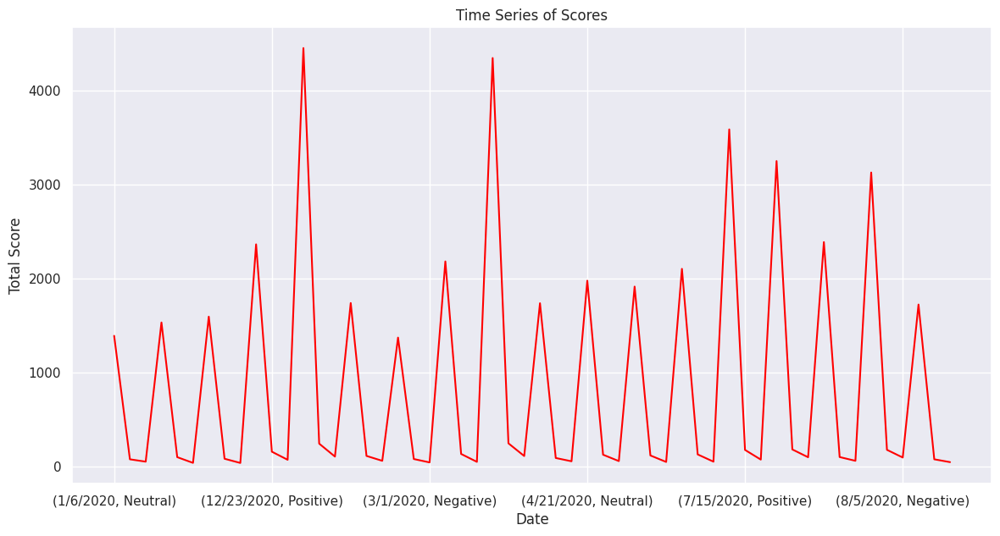

In [82]:
# Aggregate scores by date
time_series = stagea.groupby('Date')['sentiment_label'].value_counts()

# Plot the time series of scores
plt.figure(figsize=(14, 7))
time_series.plot(title='Time Series of Scores', color='red')
plt.xlabel('Date')
plt.ylabel('Total Score')
plt.grid(True)
plt.show()

In [83]:
dfa_1 = dfa.copy()

dfa_1['Date'] = pd.to_datetime(dfa_1['Date'])
dfa_1.set_index('Date', inplace=True)
# Calculate the daily mean of sentiment scores
dfa_1['polarity'] = dfa_1['polarity'].resample('D').mean()

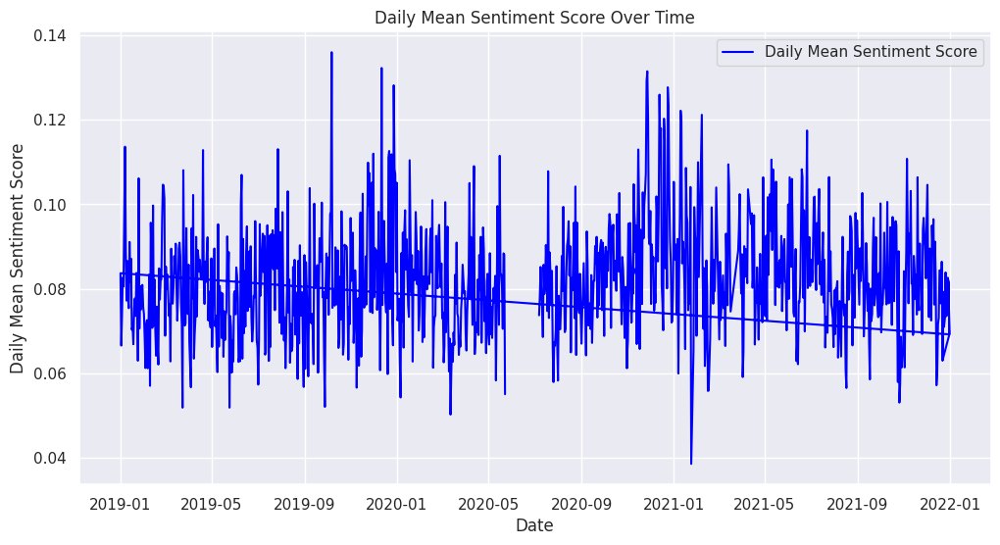

In [84]:
plt.figure(figsize=(12, 6))
plt.plot(dfa_1.index.values, dfa_1['polarity'].values, label='Daily Mean Sentiment Score', color='blue')
plt.title('Daily Mean Sentiment Score Over Time')
plt.xlabel('Date')
plt.ylabel('Daily Mean Sentiment Score')
plt.legend()
plt.show()


#### Performing seasonal decomposition and visualizing the components for the daily mean polarity scores. 

These components represent different aspects of the time series data:

- trend: This represents the underlying trend or pattern in the data.
- seasonal: This represents the periodic, repeating patterns in the data, often associated with seasonality.
- residual: This represents the noise or unexplained variation in the data after removing the trend and seasonal components.

In [85]:
# Perform decomposition and time series analysis for daily mean scores
decomposition = sm.tsa.seasonal_decompose(dfa_1['polarity'], model='additive', period=365)
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

<Figure size 1200x600 with 0 Axes>

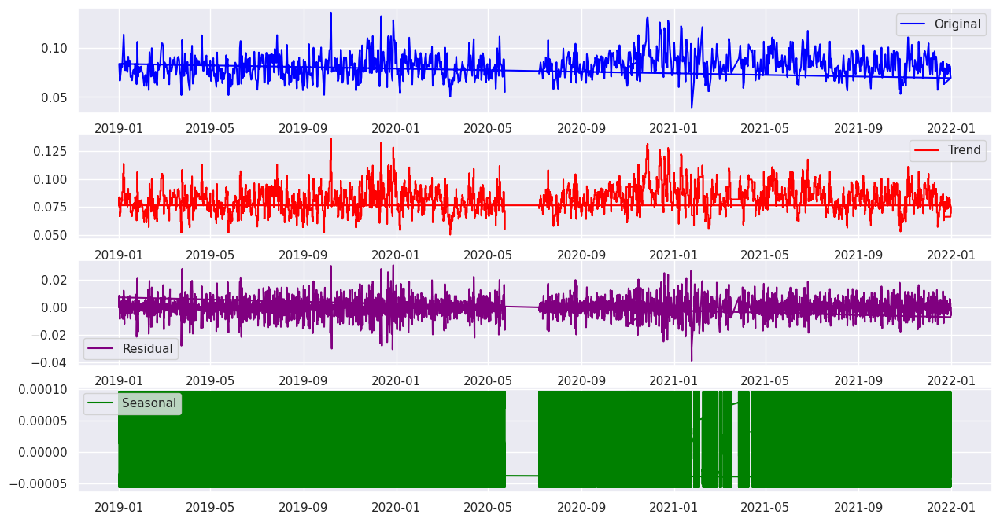

In [86]:
plt.figure(figsize=(12, 6))
fig, axs = plt.subplots(4)
#fig.suptitle('Vertically stacked subplots')
axs[0].plot(dfa_1.index.values, dfa_1['polarity'].values, label='Original', color='blue')
axs[0].legend()
axs[1].plot(dfa_1.index.values, trend.values, label='Trend', color='red')
axs[1].legend()
axs[2].plot(dfa_1.index.values, residual.values, label='Residual', color='purple')
axs[2].legend()
axs[3].plot(dfa_1.index.values, seasonal.values, label='Seasonal', color='green')
axs[3].legend()

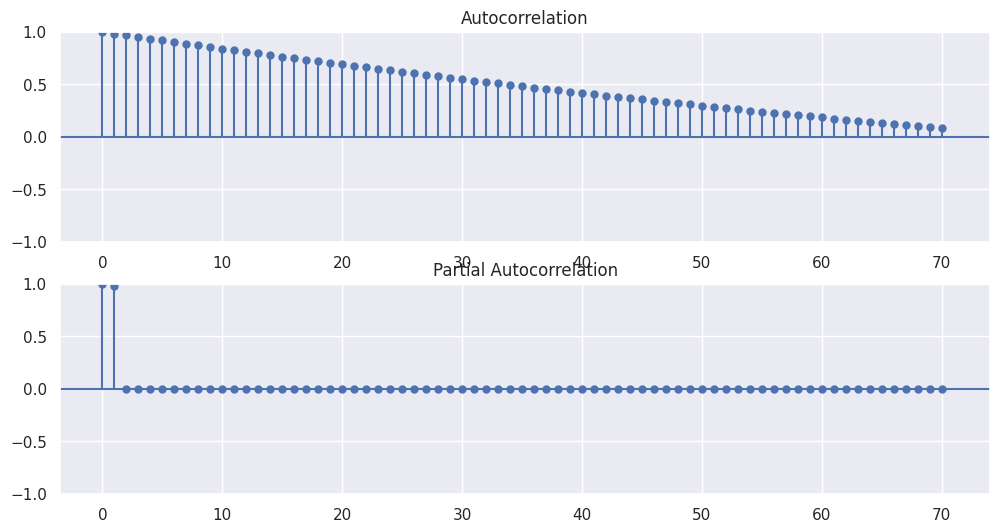

In [87]:
# Perform auto-correlation and partial auto-correlation analysis
fig, ax = plt.subplots(2, 1, figsize=(12, 6))
sm.graphics.tsa.plot_acf(residual.dropna(), lags=70, ax=ax[0])
sm.graphics.tsa.plot_pacf(residual.dropna(), lags=70, ax=ax[1])
plt.show()

An Autocorrelation Function (ACF) plot, generally such a plot is used to measure the correlation between time series data points at different lags. It is a crucial tool in time series analysis, particularly for identifying whether a series is stationary and for identifying potential seasonal patterns or cycles.

Here's a general guide on how to interpret an ACF plot:

- Spikes at certain lags that are above the significance bounds (usually represented by blue or dotted horizontal lines) indicate positive autocorrelation at those lags.
- Spikes that extend below the significance bounds indicate negative autocorrelation.
-  A slow decay in the spikes as the lags increase suggests a non-stationary series.
- Sharp cutoffs after a few lags, with subsequent lags being insignificant (within the bounds), might suggest an AR(p) model for the data.
- If there are significant spikes at fixed intervals, this might indicate seasonality in the data.







In [88]:
stagea_1 = stagea.copy()
# Perform decomposition and time series analysis for daily mean scores
decomposition = sm.tsa.seasonal_decompose(stagea_1['polarity'], model='additive', period=365)
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

<Figure size 2000x1500 with 0 Axes>

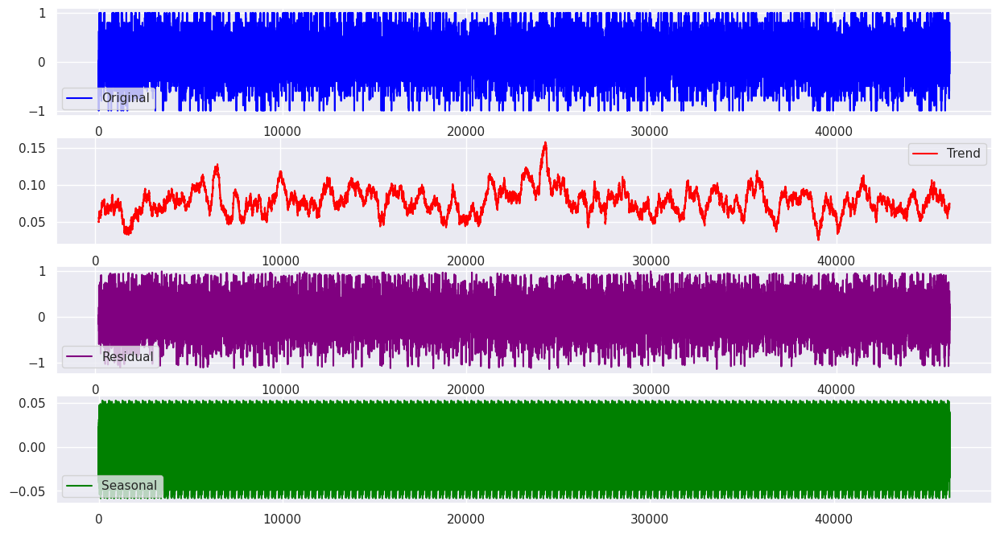

In [89]:
plt.figure(figsize=(20, 15))
fig, axs = plt.subplots(4)
#fig.suptitle('Vertically stacked subplots')
axs[0].plot(stagea_1.index.values, stagea_1['polarity'].values, label='Original', color='blue')
axs[0].legend()
axs[1].plot(stagea_1.index.values, trend.values, label='Trend', color='red')
axs[1].legend()
axs[2].plot(stagea_1.index.values, residual, label='Residual', color='purple')
axs[2].legend()
axs[3].plot(stagea_1.index.values, seasonal.values, label='Seasonal', color='green')
axs[3].legend()

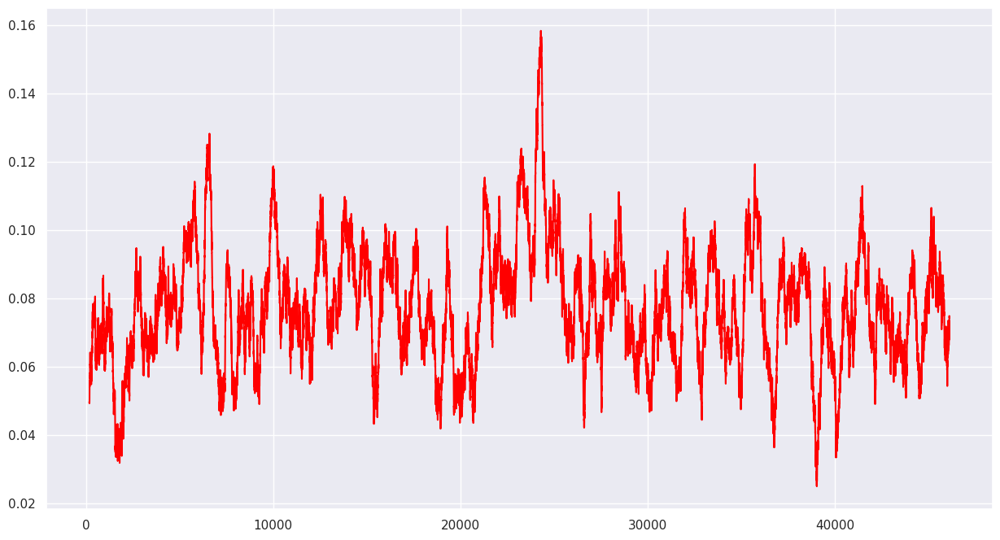

In [90]:
plt.plot(stagea_1.index, trend, label='Trend', color='red')

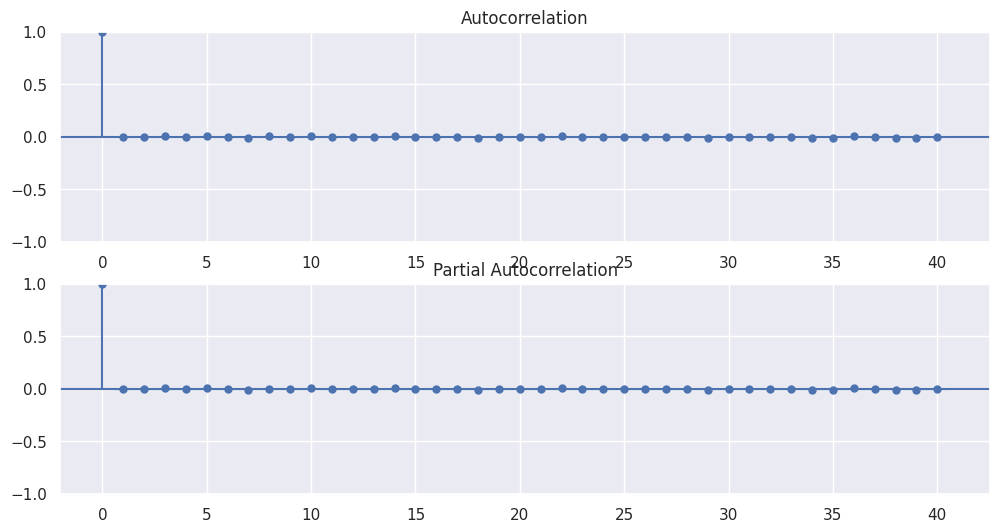

In [91]:
# Perform auto-correlation and partial auto-correlation analysis
fig, ax = plt.subplots(2, 1, figsize=(12, 6))
sm.graphics.tsa.plot_acf(residual.dropna(), lags=40, ax=ax[0])
sm.graphics.tsa.plot_pacf(residual.dropna(), lags=40, ax=ax[1])
plt.show()

## Topic Modelling

*****
A type of statistical model for discovering the abstract "topics" that occur in a collection of documents. A document typically concerns multiple topics in different proportions; thus, in a document that is 10% about cats and 90% about dogs, there would probably be about 9 times more dog words than cat words. The "topics" produced by topic modeling techniques are clusters of similar words. A topic model captures this intuition in a mathematical framework, which allows examining a set of documents and discovering, based on the statistics of the words in each, what the topics might be and what each document's balance of topics is.
*****

![](https://theintelligenceofinformation.files.wordpress.com/2016/12/topic-modeling-for-learning-analytics-researchers-lak15-tutorial-15-638.jpg)

### Popular topic modeling algorithms include Latent Semantic Analysis (LSA) a.k.a Latent Semantic Indexing , Hierarchical Dirichlet Process (HDP), Latent Dirichlet Allocation (LDA) and Non-negative Matrix factorization among which LDA has shown great results in practice and therefore widely adopted. We'll look at them all one by one if there is time. Lets get to it. 

#### Sub-Task 5.1: Preprocessing for Topic Modeling

In [92]:
st1= ['after', 'afterwards','again','against', 'all', 'almost','alone','along','already', 'also', 'although','always',
           'am','among','amongst','amoungst', 'amount', 'an','and','another','any','anyhow', 'anyone', 'anything',
           'anyway', 'anywhere','are','around', 'as', 'at','back', 'be','became','because', 'become','becomes',
           'becoming',   'been',  'before','beforehand','behind', 'being', 'below', 'beside','besides', 'between','beyond',
           'bill', 'both', 'bottom', 'but', 'by', 'call', 'can', 'cannot', 'cant', 'co', 'con', 'could', 'couldnt',
           'cry', 'de', 'describe', 'detail',  'do', 'done',  'down', 'due',  'during','each', 'eg', 'eight', 'either',
           'eleven', 'else','elsewhere','empty','enough', 'etc','even',  'ever', 'every', 'everyone', 'everything',
           'everywhere', 'except', 'few', 'fifteen', 'fifty', 'fill', 'find', 'fire', 'first', 'five', 'for', 'former',
           'formerly',  'forty','found',  'four', 'from','front', 'full','further',  'get','give', 'go', 'had','has',
           'hasnt', 'have', 'he', 'hence', 'her', 'here', 'hereafter', 'hereby', 'herein', 'hereupon','hers',
           'herself',  'him', 'himself', 'his', 'how', 'however', 'hundred', 'i','ie', 'if', 'in','inc' 'indeed','interest',
           'into','is', 'it', 'its', 'itself', 'keep', 'last', 'latter',  'latterly', 'least', 'less', 'ltd', 'made',
           'many', 'may', 'me', 'meanwhile', 'might', 'mill', 'mine', 'more',  'moreover',  'most',  'mostly',
           'move',   'much',  'must', 'my', 'myself','name','namely', 'neither', 'never', 'nevertheless', 'next',
           'nine',   'no', 'nobody', 'none', 'noone', 'nor','not', 'nothing', 'now', 'nowhere', 'of', 'off',
           'often', 'on', 'once', 'one','only','onto', 'or', 'other', 'others', 'otherwise', 'our',
           'ours', 'ourselves',  'out', 'over', 'own', 'part', 'per', 'perhaps', 'please', 'put', 'rather',   're',  'same',
           'see', 'seem', 'seemed', 'seeming','seems',  'serious',  'several', 'she',  'should', 'show', 'side',
           'since', 'sincere', 'six', 'sixty', 'so', 'some', 'somehow', 'someone',   'something','sometime',
           'sometimes', 'somewhere', 'still', 'such','system',  'take', 'ten', 'than', 'that', 'the',
           'their',  'them',   'themselves',  'then', 'thence', 'there', 'thereafter', 'thereby',    'therefore',
           'therein',  'thereupon', 'these', 'they', 'thick', 'thin', 'third',  'this', 'those', 'though',  'three','through',
           'throughout', 'thru', 'thus',   'to', 'together', 'too', 'top', 'toward', 'towards',
           'twelve','twenty',  'two', 'un',  'under', 'until',   'up', 'upon',  'us', 'very', 'via', 'was', 'we',
           'well',   'were',  'what', 'whatever', 'when','whence', 'whenever','where', 'whereafter', 'whereas',
           'whereby', 'wherein', 'whereupon','wherever', 'whether', 'which','while', 'whither', 'who','whoever',
           'whole', 'whom',  'whose','why', 'will','with', 'within', 'without',  'would',  'yet', 'you','your',
           'yours', 'yourself', 'yourselves', 'com', 'www', 'https', 'gov', 'tag', 'wiki', 'said',
     'from', 'subject', 're', 'edu', 'use','a','about', 'above', 'across']



In [93]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from gensim.utils import simple_preprocess
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *

nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')


# Tokenize the text
def tokenize(text):
    return text.split()

# Remove stopwords
def remove_stopwords(text):
    stop_words = set(stopwords.words('english')).extend(st1)
    filtered_words = [word for word in text if word not in stop_words]
    return filtered_words

# Preprocess the text
dfa_1['body'] = dfa_1['body'].apply(simple_preprocess)


[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [94]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use','a','about', 'above', 'across'])
stop_words.extend(st1)

In [95]:
def remove_stopwords(text):
    filtered_words = [word for word in text if word not in stop_words]
    return ' '.join(filtered_words)

dfa_1['body'] = dfa_1['body'].apply(remove_stopwords)

In [96]:
dfa_1.head()

,body,id,parent_id,score,polarity,subjectivity,fake_likelihood,sentiment_label
Date,,,,,,,,
2020-05-23,good god apparently work software hope displea...,frkm2w3,t1_frk44so,1.0,0.055067,0.475000,0.650000,Neutral
2020-05-23,used live near tune pretty happy especially mo...,frkm25i,t3_gp9g1d,1.0,0.055067,0.780000,0.462727,Neutral
2020-05-23,hope fiasco makes general public aware lack pu...,frkm22r,t3_gp9r8h,1.0,0.055067,0.429167,0.963333,Neutral
2020-05-23,thank asking real question,frkm1zl,t1_frj5uuk,1.0,0.055067,0.300000,1.000000,Neutral
2020-05-23,restaurants sell alcohol liquor gas stations s...,frklyq2,t3_gowk9h,1.0,0.055067,1.000000,0.500000,Neutral


In [97]:
dfa_1['body'] = dfa_1['body'].apply(simple_preprocess)
dfa_1.head()

,body,id,parent_id,score,polarity,subjectivity,fake_likelihood,sentiment_label
Date,,,,,,,,
2020-05-23,"[good, god, apparently, work, software, hope, ...",frkm2w3,t1_frk44so,1.0,0.055067,0.475000,0.650000,Neutral
2020-05-23,"[used, live, near, tune, pretty, happy, especi...",frkm25i,t3_gp9g1d,1.0,0.055067,0.780000,0.462727,Neutral
2020-05-23,"[hope, fiasco, makes, general, public, aware, ...",frkm22r,t3_gp9r8h,1.0,0.055067,0.429167,0.963333,Neutral
2020-05-23,"[thank, asking, real, question]",frkm1zl,t1_frj5uuk,1.0,0.055067,0.300000,1.000000,Neutral
2020-05-23,"[restaurants, sell, alcohol, liquor, gas, stat...",frklyq2,t3_gowk9h,1.0,0.055067,1.000000,0.500000,Neutral


#### Sub-Task 5.2: Extracting Topics

In [98]:
import gensim
from gensim import corpora
from gensim.models import LdaModel

# Create a dictionary of words
dictionary = corpora.Dictionary(dfa_1['body'])

# Create a corpus of bag-of-words vectors
corpus = [dictionary.doc2bow(text) for text in dfa_1['body']]

# Train an LDA model
lda_model = LdaModel(corpus, id2word=dictionary, num_topics=10)

# Get the topic distribution for each document
topic_distribution = lda_model[corpus]

# Add the topic distribution to the DataFrame
dfa_1['topic_distribution'] = topic_distribution


In [99]:
dfa_1.index = range(1, len(dfa_1) + 1)

#### Display topic distribution

In [100]:
import random

# Select a random subset of documents (e.g., 10 documents) for visualization
num_documents_to_display = 5
sample_documents = random.sample(range(len(dfa_1)), num_documents_to_display)

for document_index in sample_documents:
    topic_probabilities = dfa_1.loc[document_index, 'topic_distribution']
    print(f"Document {document_index + 1}:")
    for topic_id, probability in topic_probabilities:
        print(f"Topic {topic_id + 1}: {probability:.2f}")

Document 449543:
Topic 1: 0.12
Topic 2: 0.12
Topic 3: 0.01
Topic 4: 0.18
Topic 5: 0.12
Topic 6: 0.01
Topic 7: 0.12
Topic 8: 0.01
Topic 9: 0.29
Topic 10: 0.01
Document 842244:
Topic 1: 0.02
Topic 2: 0.02
Topic 3: 0.02
Topic 4: 0.02
Topic 5: 0.02
Topic 6: 0.02
Topic 7: 0.02
Topic 8: 0.62
Topic 9: 0.22
Topic 10: 0.02
Document 415760:
Topic 1: 0.02
Topic 2: 0.02
Topic 3: 0.02
Topic 4: 0.30
Topic 5: 0.02
Topic 6: 0.02
Topic 7: 0.02
Topic 8: 0.54
Topic 9: 0.02
Topic 10: 0.02
Document 204747:
Topic 1: 0.03
Topic 2: 0.03
Topic 3: 0.03
Topic 4: 0.03
Topic 5: 0.03
Topic 6: 0.28
Topic 7: 0.03
Topic 8: 0.03
Topic 9: 0.03
Topic 10: 0.52
Document 1869909:
Topic 6: 0.19
Topic 7: 0.23
Topic 10: 0.51


In [104]:
import random

# Select a random subset of documents (e.g., 10 documents) for visualization
num_documents_to_display = 5
sample_documents = random.sample(range(len(dfa_1)), num_documents_to_display)

for document_index in sample_documents:
    topic_probabilities = dfa_1.loc[document_index, 'topic_distribution']
    print(f"Document {document_index + 1}:")
    for topic_id, probability in topic_probabilities:
        print(f"Topic {topic_id + 1}: {probability:.2f}")

Document 1090938:
Topic 1: 0.14
Topic 2: 0.14
Topic 3: 0.17
Topic 4: 0.23
Topic 5: 0.01
Topic 6: 0.14
Topic 7: 0.01
Topic 8: 0.01
Topic 9: 0.01
Topic 10: 0.14
Document 130834:
Topic 1: 0.03
Topic 2: 0.03
Topic 3: 0.03
Topic 4: 0.03
Topic 5: 0.03
Topic 6: 0.03
Topic 7: 0.03
Topic 8: 0.03
Topic 9: 0.37
Topic 10: 0.37
Document 1382705:
Topic 2: 0.36
Topic 5: 0.16
Topic 10: 0.42
Document 609131:
Topic 1: 0.03
Topic 2: 0.70
Topic 3: 0.03
Topic 4: 0.03
Topic 5: 0.03
Topic 6: 0.03
Topic 7: 0.03
Topic 8: 0.03
Topic 9: 0.03
Topic 10: 0.03
Document 1411964:
Topic 1: 0.01
Topic 2: 0.01
Topic 3: 0.01
Topic 4: 0.01
Topic 5: 0.14
Topic 6: 0.14
Topic 7: 0.01
Topic 8: 0.21
Topic 9: 0.14
Topic 10: 0.32


Dividing data into years

In [105]:
df_t = dfa.copy()
df_t['Date'] = pd.to_datetime(df_t['Date'])

specific_year = 2019

# Subset the data based on the specific year
df_2019 = df_t[df_t['Date'].dt.year == specific_year]
df_2019.shape

(527857, 9)

In [106]:
specific_year = 2020

# Subset the data based on the specific year
df_2020 = df_t[df_t['Date'].dt.year == specific_year]
df_2020.shape

(695477, 9)

In [107]:
specific_year = 2021

# Subset the data based on the specific year
df_2021 = df_t[df_t['Date'].dt.year == specific_year]
df_2021.shape

(862432, 9)

bg_rows = np.random.choice(bg.index.values, 750)
bg_data = bg.ix[bg_rows]

tg_rows = np.random.choice(tg.index.values, 750)
tg_data = tg.ix[tg_rows]

eg_rows = np.random.choice(eg.index.values, 750)
eg_data = eg.ix[eg_rows]

mg_rows = np.random.choice(mg.index.values, 750)
mg_data = mg.ix[mg_rows]

### Selecting sample rows from all years so computations are quicker. 

In [108]:
df_2019_data = df_2019.loc[np.random.choice(df_2019.index, 20000)]
df_2020_data = df_2020.loc[np.random.choice(df_2020.index, 20000)]
df_2021_data = df_2021.loc[np.random.choice(df_2021.index, 20000)]

In [109]:
result = pd.concat([df_2019_data, df_2020_data, df_2021_data], ignore_index=True)

result.head()

,body,Date,id,parent_id,score,polarity,subjectivity,fake_likelihood,sentiment_label
0,Thanks for posting this. Viewing on mobile is...,2019-07-31,evlkbdl,t1_evlj4hk,1.0,-0.250000,0.600000,1.150,Neutral
1,Besides Charles Whitman?,2019-07-05,et0gseb,t3_c9igue,1.0,0.000000,0.000000,1.500,Neutral
2,"Yeah, once you're underwater on car financing ...",2019-08-07,ew8ytqo,t1_ew8xryv,1.0,-0.291667,0.541667,1.250,Neutral
3,[Mt Bonnel](https://www.google.com/maps/place/...,2019-10-10,f3937xi,t3_dg4na6,1.0,0.000000,0.000000,1.500,Neutral
4,&gt; That’s an oversimplification.\n\nI'm a da...,2019-05-24,eomz7e9,t1_eom4ifk,1.0,0.300000,0.375000,0.825,Neutral


In [110]:
title = result['body']
category = result['sentiment_label']

<a id='lsa'></a>

# Latent Semantic Analysis

![](https://nlp.stanford.edu/IR-book/html/htmledition/img1822.png)

Latent Semantic Analysis (LSA) is a mathematical method that tries to bring out latent relationships within a collection of documents on to a lower dimensional space. LSA assumes that words that are close in meaning will occur in similar pieces of text (the distributional hypothesis). A matrix containing word counts per paragraph (rows represent unique words and columns represent each paragraph) is constructed from a large piece of text and a mathematical technique called singular value decomposition (SVD) is used to reduce the number of rows while preserving the similarity structure among columns.  Rather than looking at each document isolated from the others it looks at all the documents as a whole and the terms within them to identify relationships.

Singular value decomposition can be used to solve the low-rank matrix approximation problem. We then derive from it an application to approximating term-document matrices. We invoke the following three-step procedure to this end:
***
 * Given $C$, construct its SVD in the form $C=U\Sigma V^T$.
 * Derive from $\Sigma$ the matrix $\Sigma_k$ formed by replacing by zeros the $r-k$ smallest singular values on the diagonal of $\Sigma$.
 * Compute and output $C_k$= $U\Sigma_k V^T$ as the rank-$k$ approximation to $C$.;
​
Where C is the term-document matrix and $U$, $\Sigma$ and $V^T$ are SVD computed matrices.
***

> > **Done with theory, on to Python now!  For LSI,  i'll be using scikit learn module**
​
**Importing modules from scikit learn and countvector-izing them first. ** 
​
**In Scikit learn, Dimensionality reduction for LSA is done using truncated SVD (aka LSA).**

In [111]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use','a','about', 'above', 'across'])
stop_words.extend(st1)

In [112]:
from sklearn.decomposition import NMF, LatentDirichletAllocation, TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer
 
NUM_TOPICS = 10

# Converting the document to a matrix of token counts

vectorizer = CountVectorizer(min_df=5, max_df=0.9, 
                             stop_words='english', lowercase=True, 
                             token_pattern='[a-zA-Z\-][a-zA-Z\-]{2,}')
data_vectorized = vectorizer.fit_transform(title)
 
# Build a Latent Semantic Indexing Model using SVD

lsi_model = TruncatedSVD(n_components=NUM_TOPICS)
lsi_Z = lsi_model.fit_transform(data_vectorized)
print(lsi_Z.shape)

(60000, 10)


In [113]:
def print_topics(model, vectorizer, top_n=10):
    feature_names = vectorizer.get_feature_names_out()
    for idx, topic in enumerate(model.components_):
        print("Topic %d:" % (idx))
        print([(feature_names[i], topic[i])
               for i in topic.argsort()[:-top_n - 1:-1]])

print("LSI Model:")
print_topics(lsi_model, vectorizer)
print("=" * 20)

LSI Model:
Topic 0:
[('https', 0.4060220164519252), ('austin', 0.40311988056401216), ('com', 0.3912971710291474), ('www', 0.29692810076900483), ('people', 0.20385000989082466), ('reddit', 0.1623259549940435), ('just', 0.15539467347790883), ('like', 0.13185978047882035), ('don', 0.12329088040223964), ('amp', 0.11676469967688397)]
Topic 1:
[('com', 0.31436746928379933), ('https', 0.3014311751185529), ('www', 0.2282585333181571), ('reddit', 0.13625091949742082), ('message', 0.09903721395429979), ('amp', 0.07055337198767571), ('http', 0.06717118605148424), ('comments', 0.05615733689481311), ('compose', 0.04326402504903224), ('news', 0.04243891087753135)]
Topic 2:
[('https', 0.2513422660261001), ('com', 0.1989164454297657), ('www', 0.19663022604192956), ('people', 0.17614010454301043), ('news', 0.10066460930009447), ('just', 0.07321620547186355), ('amp', 0.07308501952586119), ('wilco', 0.06491108652173355), ('article', 0.05579163605721305), ('org', 0.05263309132653664)]
Topic 3:
[('annual',

In [114]:
def get_topics(model, vectorizer, top_n=10):
    feature_names = vectorizer.get_feature_names_out()
    topics = []

    for idx, topic in enumerate(model.components_):
        topic_words = [(feature_names[i], topic[i]) for i in topic.argsort()[:-top_n - 1:-1]]
        topics.append({'Topic': idx, 'Words': [word for word, _ in topic_words]})

    return pd.DataFrame(topics)

# Example usage:
topics_df = get_topics(lsi_model, vectorizer)
print(topics_df)


   Topic                                              Words
0      0  [https, austin, com, www, people, reddit, just...
1      1  [com, https, www, reddit, message, amp, http, ...
2      2  [https, com, www, people, news, just, amp, wil...
3      3  [annual, engineer, year, tech, amp, sales, man...
4      4  [https, animal, pet, shelter, annual, people, ...
5      5  [said, city, texas, state, county, police, new...
6      6  [people, austin, said, city, police, homeless,...
7      7  [don, like, know, think, want, amp, really, me...
8      8  [don, just, know, think, want, said, reddit, m...
9      9  [amp, said, message, time, reddit, jack, nate,...


In [115]:
import pandas as pd

def get_topics(model, vectorizer, top_n=10):
    feature_names = vectorizer.get_feature_names_out()
    topics = []

    for idx, topic in enumerate(model.components_):
        topic_words = [(feature_names[i], topic[i]) for i in topic.argsort()[:-top_n - 1:-1]]
        topics.append({'Topic': idx, 'Words': [word for word, _ in topic_words], 'Probabilities': [prob for _, prob in topic_words]})

    return pd.DataFrame(topics)

# Example usage:
topics_df = get_topics(lsi_model, vectorizer)
topics_df


,Topic,Words,Probabilities
0,0,"[https, austin, com, www, people, reddit, just...","[0.4060220164519252, 0.40311988056401216, 0.39..."
1,1,"[com, https, www, reddit, message, amp, http, ...","[0.31436746928379933, 0.3014311751185529, 0.22..."
2,2,"[https, com, www, people, news, just, amp, wil...","[0.2513422660261001, 0.1989164454297657, 0.196..."
3,3,"[annual, engineer, year, tech, amp, sales, man...","[0.8555806010385844, 0.1858920185248663, 0.172..."
4,4,"[https, animal, pet, shelter, annual, people, ...","[0.29023234766820133, 0.2549581618991616, 0.25..."
5,5,"[said, city, texas, state, county, police, new...","[0.37592873870152194, 0.2297556046152318, 0.20..."
6,6,"[people, austin, said, city, police, homeless,...","[0.5889771159318663, 0.1958595715102872, 0.181..."
7,7,"[don, like, know, think, want, amp, really, me...","[0.5649718771860505, 0.27916589073104514, 0.15..."
8,8,"[don, just, know, think, want, said, reddit, m...","[0.4934219999273054, 0.172756064196953, 0.1466..."
9,9,"[amp, said, message, time, reddit, jack, nate,...","[0.5247560446086198, 0.2904730508665665, 0.234..."


### above are the topics by the LSI model. 

In [116]:
from sklearn.manifold import TSNE
# NLTK
from nltk.tokenize import RegexpTokenizer
from nltk.stem.snowball import SnowballStemmer
from nltk.corpus import stopwords
import re

# Visualization
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib
%matplotlib inline
import seaborn as sns

# Bokeh
from bokeh.io import output_notebook
from bokeh.plotting import figure, show
from bokeh.models import HoverTool, CustomJS, ColumnDataSource, Slider
from bokeh.layouts import column
from bokeh.palettes import all_palettes
output_notebook()

Loading BokehJS ...

### Lets now visualise the LSI model and see the words and documents that are close to each other according to the model

### Documents

In [117]:
import pandas as pd
from bokeh.io import push_notebook, show, output_notebook
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, LabelSet
output_notebook()

svd = TruncatedSVD(n_components=100)
documents_2d = svd.fit_transform(data_vectorized)
 
dfdf = pd.DataFrame(columns=['x', 'y', 'document'])
dfdf['x'], dfdf['y'], dfdf['document'] = documents_2d[:,0], documents_2d[:,1], range(len(result))
 
source = ColumnDataSource(ColumnDataSource.from_df(dfdf))
labels = LabelSet(x="x", y="y", text="document", y_offset=8,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
 
plot = figure(width=600, height=600)
plot.circle("x", "y", size=12, source=source, line_color="black", fill_alpha=0.8)
plot.add_layout(labels)
show(plot, notebook_handle=True)

Loading BokehJS ...

### The Inference from the plot above is that similar documents are plotted close by in a low dimensional space. Same with words(although not the objective here) shown below, 

### Words

<a id='lda'></a>

# Latent Dirichlet Allocation

### Corpus - Document - Word : Topic Generation

***
**Is a generative statistical model that allows sets of observations to be explained by unobserved groups that explain why some parts of the data are similar. For example, if observations are words collected into documents, it posits that each document is a mixture of a small number of topics and that each word's presence is attributable to one of the document's topics.**
***

 <hr>
           
           LSI examines the words used in a document and looks for their relationships with other words. LSI allows a system to determine the kind of words that a document might be relevant for, even if they are not actually used on the document itself.  But having content that is full of words that have relationships with each other, you are strengthening the document for all of those words.
        
           LDA is a significant extension of LSI.  Words are grouped into topics.  They can exist in more than one topic, in fact most do.  LDA tackles ambiguity by comparing a document to two topics and determining which topic is closer to the document, across all combinations of topics which seem broadly relevant. In doing so, LDA helps to determine which documents are most relevant to which topics.
<hr/>

![](https://upload.wikimedia.org/wikipedia/commons/thumb/d/d3/Latent_Dirichlet_allocation.svg/593px-Latent_Dirichlet_allocation.svg.png)

***
α is the parameter of the Dirichlet prior on the per-document topic distributions,
β is the parameter of the Dirichlet prior on the per-topic word distribution,
$ \theta _{m}$ is the topic distribution for document m,
$\varphi _{k}$ is the word distribution for topic k,
$z_{mn}$ is the topic for the n-th word in document m, and
$w_{mn}$ is the specific word.
​
***
The fact that W is grayed out means that words $\displaystyle w_{ij}$ are the only observable variables, and the other variables are latent variables. A sparse Dirichlet prior can be used to model the topic-word distribution, following the intuition that the probability distribution over words in a topic is skewed, so that only a small set of words have high probability. The resulting model is the most widely applied variant of LDA today. The plate notation for this model is shown below, where $\displaystyle K$  denotes the number of topics and $\displaystyle \varphi _{1},\dots ,\varphi _{K}$ are $\displaystyle V$-dimensional vectors storing the parameters of the Dirichlet-distributed topic-word distributions ( $\displaystyle V$ is the number of words in the vocabulary).
​
It is helpful to think of the entities represented by $\displaystyle \theta$ and $\displaystyle \varphi$ as matrices created by decomposing the original document-word matrix that represents the corpus of documents being modeled. In this view, $\displaystyle \theta$  consists of rows defined by documents and columns defined by topics, while $\displaystyle \varphi$ consists of rows defined by topics and columns defined by words. Thus, $\displaystyle \varphi _{1},\dots ,\varphi _{K}$ refers to a set of rows, or vectors, each of which is a distribution over words, and $\displaystyle \theta _{1},\dots ,\theta _{M}$ refers to a set of rows, each of which is a distribution over topics.
​
***

![](https://upload.wikimedia.org/wikipedia/commons/4/4d/Smoothed_LDA.png)

**LDA assumes that each document in a corpus contains a mix of topics that are found throughout the entire corpus. The topic structure is hidden - we can only observe the documents and words, not the topics themselves. Because the structure is hidden (also known as latent), this method seeks to infer the topic structure given the known words and documents.**

### LDA Document Structure

### LDA represents documents as mixtures of topics that spit out words with certain probabilities. It assumes that documents are produced in the following fashion: when writing each document, you

***
* Decide on the number of words N the document will have.
* Choose a topic mixture for the document (according to a Dirichlet probability distribution over a fixed set of K topics). 
* Generate each word in the document by:
    *  First picking a topic.
    * Then using the topic to generate the word itself (according to the topic’s multinomial distribution).
    * Assuming this generative model for a collection of documents, LDA then tries to backtrack from the documents to find a set of topics that are likely to have generated the collection.
***

## Now that we saw the theory aspects and the maths behind, lets see how to do it in python,

### Convert to list so we can do some pre-processing

In [118]:
# Convert to list
dfas = result.body.values.tolist()

dfas = [re.sub('\S*@\S*\s?', '', sent) for sent in dfas]

# Remove new line characters
dfas = [re.sub('\s+', ' ', sent) for sent in dfas]

# Remove distracting single quotes
dfas = [re.sub("\'", "", sent) for sent in dfas]

pprint(dfas[:3])

['Thanks for posting this. Viewing on mobile is atrocious.',
 'Besides Charles Whitman?',
 'Yeah, once youre underwater on car financing its really hard to get out of.']


In [119]:
dfas = [re.sub("-", " ", sent) for sent in dfas]
dfas = [re.sub(":", "", sent) for sent in dfas]

### All punctuations need to be removed, so lets write a function for that and we'll use the gensim package for that. deacc=TRUE does that. 

In [120]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

df_words = list(sent_to_words(dfas))

### N-gram models

### Creating Bigram and Trigram Models

### What are they? 

### Bigrams are two words frequently occurring together in the document. Trigrams are 3 words frequently occurring. Gensim's Phrases method helps us with that. 

In [121]:
# Build the bigram and trigram models

bigram = gensim.models.Phrases(df_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[df_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram

bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

### We need to apply the bigrams, trigrams and lemmatize the set of documents we are working with.

###  mm lemmatize ? ok  It is the process of grouping together the inflected forms of a word so they can be analysed as a single item, identified by the word's lemma, or dictionary form.

### To do that, lets create few functions. 

In [122]:
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

### Applying the custom functions to our dataset

In [123]:
# Remove Stop Words

data_words_nostops = remove_stopwords(df_words)

# Form Bigrams

data_words_bigrams = make_bigrams(data_words_nostops)

nlp = spacy.load("en_core_web_sm", disable=['parser', 'ner'])

data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

### As we saw in the definition above, converting our document set into a document-term matrix.

In [124]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

### Readable format of corpus (term-frequency)

In [125]:
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[11:12]]

[[('actually', 1), ('hate', 2)]]

### Building the LDA model

In [126]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=5, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

### Now that the model is built, lets print the Keyword in the 10 topics

In [127]:
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.029*"s" + 0.026*"year" + 0.018*"make" + 0.015*"covid" + 0.014*"new" + '
  '0.012*"state" + 0.011*"high" + 0.011*"reddit" + 0.011*"great" + '
  '0.010*"tell"'),
 (1,
  '0.035*"good" + 0.024*"thank" + 0.024*"water" + 0.020*"post" + '
  '0.016*"delete" + 0.015*"austin" + 0.013*"move" + 0.012*"question" + '
  '0.011*"house" + 0.011*"little"'),
 (2,
  '0.022*"re" + 0.021*"pay" + 0.019*"live" + 0.018*"help" + 0.015*"take" + '
  '0.014*"area" + 0.013*"leave" + 0.012*"buy" + 0.012*"maybe" + 0.011*"wait"'),
 (3,
  '0.036*"people" + 0.022*"go" + 0.022*"think" + 0.017*"time" + 0.016*"know" + '
  '0.014*"m" + 0.014*"work" + 0.014*"want" + 0.013*"need" + 0.013*"thing"'),
 (4,
  '0.042*"get" + 0.024*"right" + 0.021*"lot" + 0.017*"use" + 0.016*"home" + '
  '0.015*"week" + 0.013*"drive" + 0.012*"kid" + 0.011*"money" + 0.011*"month"')]


### Right, now that the LDA model is built, there has to be a metric to evaluate how good the model is. Lets compute that to check how good it is. 


### There are 2 such metrics. 

### 1)   Perplexity -  Is a statistical measure of how well a probability model predicts a sample. As applied to LDA, for a given value of k, you estimate the LDA model. Then given the theoretical word distributions represented by the topics, compare that to the actual topic mixtures, or distribution of words in your documents. - Lower the better.
### 2)  Coherence Score - Is defined as the average / median of the pairwise word-similarity scores of the words in the topic - Higher the better.
                          

In [128]:
# Compute Perplexity

print('\nPerplexity: ', lda_model.log_perplexity(corpus)) 

# Compute Coherence Score

coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -8.394376078922381

Coherence Score:  0.5660737055190717


> ** From the model we created, lets look at the most salient terms under each topic that contributes to it the most** 

In [129]:
#conda install -c conda-forge pyldavis

In [130]:
#import sys
#!conda install --yes --prefix {sys.prefix} pyldavis

In [131]:
#conda install -c anaconda pandas

In [132]:
# Install a pip package in the current Jupyter kernel
#import sys
#!{sys.executable} -m pip install 

In [133]:
#import pandas as pd

## TOPIC MODELLING

In [134]:
import pyLDAvis
from gensim.models import LdaModel

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
pyLDAvis.display(vis)

In the context of pyLDAvis, the relevance metric, often referred to as the "lambda" parameter, is a way to balance the importance of two different measures when visualizing topics generated by Latent Dirichlet Allocation (LDA) or similar topic models. These two measures are:

1. **Topic-Term Relevance:** This measure assesses how relevant individual terms (words) are to a specific topic. Higher relevance means that the terms in a topic are more closely related to that topic.

2. **Topic-Document Relevance:** This measure assesses how relevant a topic is to a specific document in the corpus. Higher relevance means that the topic is more relevant or significant to the document.

The relevance metric, often denoted as "lambda" (λ), is a parameter that allows you to adjust the balance between these two measures when visualizing topics with pyLDAvis. The relevance metric can take values from 0 to 1, and it controls the weight given to term relevance (λ closer to 0) versus document relevance (λ closer to 1).

- When λ is closer to 0 (e.g., λ = 0.2), the visualization will emphasize term relevance. This means that the most relevant terms within a topic will be more prominent in the topic's representation.

- When λ is closer to 1 (e.g., λ = 0.8), the visualization will emphasize document relevance. This means that topics that are more relevant to documents in the corpus will be more prominent.

By adjusting the λ parameter, you can tailor the visualization to highlight the aspects of the topics that are most important for your analysis. You can experiment with different λ values to strike the right balance between term relevance and document relevance based on your specific goals and the characteristics of your data.

Overall, the relevance metric in pyLDAvis provides a flexible way to fine-tune the visualization of LDA topics, making it more informative and interpretable.

In [135]:
lda_model10 = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=10, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

In [136]:
pprint(lda_model10.print_topics())
doc_lda10 = lda_model10[corpus]

[(0,
  '0.078*"year" + 0.044*"new" + 0.031*"move" + 0.028*"question" + 0.026*"fuck" '
  '+ 0.021*"give" + 0.018*"sell" + 0.015*"die" + 0.014*"space" + '
  '0.013*"light"'),
 (1,
  '0.042*"come" + 0.039*"city" + 0.031*"bad" + 0.026*"austin" + 0.026*"feel" + '
  '0.023*"leave" + 0.019*"person" + 0.018*"talk" + 0.017*"love" + '
  '0.016*"price"'),
 (2,
  '0.055*"thank" + 0.040*"sure" + 0.033*"area" + 0.022*"far" + 0.021*"school" '
  '+ 0.020*"shit" + 0.020*"hope" + 0.020*"different" + 0.019*"lol" + '
  '0.018*"nice"'),
 (3,
  '0.054*"work" + 0.049*"look" + 0.039*"re" + 0.030*"home" + 0.025*"mean" + '
  '0.025*"long" + 0.020*"car" + 0.017*"reason" + 0.013*"guess" + 0.013*"low"'),
 (4,
  '0.071*"think" + 0.051*"know" + 0.044*"need" + 0.039*"right" + 0.034*"lot" + '
  '0.021*"drive" + 0.017*"money" + 0.015*"vaccine" + 0.015*"hear" + '
  '0.013*"lose"'),
 (5,
  '0.076*"s" + 0.039*"post" + 0.032*"point" + 0.030*"state" + 0.027*"reddit" + '
  '0.025*"comment" + 0.023*"old" + 0.023*"maybe" + 0.0

In [137]:
# Compute Perplexity

print('\nPerplexity: ', lda_model10.log_perplexity(corpus)) 

# Compute Coherence Score

coherence_model_lda10 = CoherenceModel(model=lda_model10, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda10 = coherence_model_lda10.get_coherence()
print('\nCoherence Score: ', coherence_lda10)


Perplexity:  -9.00483289666082

Coherence Score:  0.5190101861532914


In [138]:
import pyLDAvis
from gensim.models import LdaModel

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model10, corpus, id2word)
pyLDAvis.display(vis)

In [ ]:
import pyLDAvis.gensim_models

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
pyLDAvis.show(vis, local=False)

In [ ]:
import pyLDAvis.gensim
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis


In [ ]:
import pyLDAvis.gensim_models

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
vis

In [ ]:
topic_sentiment_correlation = df.groupby('body')['polarity'].corr()

# Identify topics with high positive or negative sentiment correlation
high_positive_topics = topic_sentiment_correlation[topic_sentiment_correlation > 0.5].index.tolist()
high_negative_topics = topic_sentiment_correlation[topic_sentiment_correlation < -0.5].index.tolist()

# Analyze the content of topics with high sentiment correlation

In [ ]:
topic_sentiment_correlation = df.groupby('body')[['polarity', 'subjectivity']].corr()


In [ ]:
topic_sentiment_correlation.head()

In [ ]:
# Identify topics with high positive or negative sentiment correlation
high_positive_topics = topic_sentiment_correlation[topic_sentiment_correlation > 0.5].index.tolist()
high_negative_topics = topic_sentiment_correlation[topic_sentiment_correlation < -0.5].index.tolist()

# Analyze the content of topics with high sentiment correlation

In [ ]:
high_positive_topics

In [ ]:
high_negative_topics

In [ ]:
 df.head()

In [ ]:
pip install pyldavis


In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
import gensim

In [ ]:
# Visualize the topics

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis

In [ ]:
# Visualize the topics

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis

In [ ]:
import pyLDAvis.gensim
import pyLDAvis.gensim_models as gensimvis


In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
import gensim

# Make sure the following have been defined and created:
# lda_model - The LDA model from Gensim
# corpus - The corpus in Gensim format
# id2word - Dictionary mapping of id to word

# Prepare the visualization
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, id2word)

# Display the visualization
vis


In [ ]:
import pyLDAvis.gensim
import gensim

# Assuming you have already defined lda_model, corpus, and id2word

# Visualize the topics
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
pyLDAvis.display(vis)
